# `Project Objective:`

**This analysis aims to derive valuable insights from the given dataset, concentrating on unraveling the intricate relationships between various features and the designated target variable, namely Salary. The primary objectives encompass:**

**In-depth characterization of the dataset and its constituent features.**

**Discerning patterns or trends inherent in the data.**

**Investigating the interplay between independent variables and the target variable (Salary).**

**Identifying any outliers or anomalies that might be present in the dataset.**


### `Import all liberies`

In [1]:
# import all liberies

import pandas as pd
import numpy as np
import warnings
import seaborn as sns
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import datetime as datetime

### `Import Dataset`

In [2]:
df = pd.read_csv("data.xlsx - Sheet1.csv")

In [3]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
print("shape of df : ",df.shape)

shape of df :  (3998, 39)


In [5]:
df.columns = df.columns.str.strip()

In [6]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

### `Droping unwanted columns`

In [7]:
df1 = df.drop(["Unnamed: 0","ID",'CollegeID','CollegeCityID','CollegeCityTier','agreeableness','conscientiousness','nueroticism','extraversion','openess_to_experience'],axis = 1)

In [8]:
df1.shape

(3998, 29)

In [9]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
Salary,3998.0,307699.849925,212737.499957,35000.00,180000.000000,300000.000000,370000.000000,4.000000e+06
10percentage,3998.0,77.925443,9.850162,43.00,71.680000,79.150000,85.670000,9.776000e+01
12graduation,3998.0,2008.087544,1.653599,1995.00,2007.000000,2008.000000,2009.000000,2.013000e+03
12percentage,3998.0,74.466366,10.999933,40.00,66.000000,74.400000,82.600000,9.870000e+01
CollegeTier,3998.0,1.925713,0.262270,1.00,2.000000,2.000000,2.000000,2.000000e+00
collegeGPA,3998.0,71.486171,8.167338,6.45,66.407500,71.720000,76.327500,9.993000e+01
GraduationYear,3998.0,2012.105803,31.857271,0.00,2012.000000,2013.000000,2014.000000,2.017000e+03
English,3998.0,501.649075,104.940021,180.00,425.000000,500.000000,570.000000,8.750000e+02
Logical,3998.0,501.598799,86.783297,195.00,445.000000,505.000000,565.000000,7.950000e+02
Quant,3998.0,513.378189,122.302332,120.00,430.000000,515.000000,595.000000,9.000000e+02


In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Salary                 3998 non-null   float64
 1   DOJ                    3998 non-null   object 
 2   DOL                    3998 non-null   object 
 3   Designation            3998 non-null   object 
 4   JobCity                3998 non-null   object 
 5   Gender                 3998 non-null   object 
 6   DOB                    3998 non-null   object 
 7   10percentage           3998 non-null   float64
 8   10board                3998 non-null   object 
 9   12graduation           3998 non-null   int64  
 10  12percentage           3998 non-null   float64
 11  12board                3998 non-null   object 
 12  CollegeTier            3998 non-null   int64  
 13  Degree                 3998 non-null   object 
 14  Specialization         3998 non-null   object 
 15  coll

### `Finding duplicates value`

In [11]:
df1.duplicated().any()

False

### `Finding null value`

In [12]:
df1.isnull().sum()

Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
dtype: int64

#### `conclusion :` After checking the information and examining null values, we can confirm that there are no null values, and there are also no duplicate values.

### `Handling datetime features`

In [13]:
# we can assuming present date 2015-12-31

df1["DOL"] = df1["DOL"].str.replace("present", "2015-12-31")

####  `conclusion :` The survey was conducted in 2015, so we can assume that the respondents for 'DOL' actually left the company within 2015 only. Therefore, we will replace the present values in 'DOL' with 2015-12-31. Additionally, we will convert "DOL," "DOJ," and "DOB" to datetime format.

In [14]:
df1["DOL"]

0         2015-12-31
1         2015-12-31
2         2015-12-31
3         2015-12-31
4        3/1/15 0:00
            ...     
3993    10/1/12 0:00
3994     7/1/13 0:00
3995      2015-12-31
3996     1/1/15 0:00
3997      2015-12-31
Name: DOL, Length: 3998, dtype: object

In [15]:
# convert in datetime format

df1["DOL"] = pd.to_datetime(df1["DOL"])
df1["DOJ"] = pd.to_datetime(df1["DOJ"])
df1["DOB"] = pd.to_datetime(df1["DOB"])

#### `To add an "Age" column by subtracting the "DOB" from the year 2015`

In [16]:

df1["Age"] = 2015 - df1["DOB"].dt.year

In [17]:
df1.shape

(3998, 30)

#### `Conclution : `The dataset was release in 2015 ,we adding a new 'Age' columnn by substracting 'DOB' from 2015.

#### `To add an "Experience" column by subtracting the "DOJ" from "DOL"`

In [18]:
df1['Experience'] = round((df1['DOL'] - df1['DOJ']).dt.days/365,1)
df1['Experience']

0       3.6
1       2.3
2       1.6
3       4.5
4       1.0
       ... 
3993    1.0
3994    0.0
3995    2.5
3996    0.5
3997    2.9
Name: Experience, Length: 3998, dtype: float64

In [19]:
df1.shape

(3998, 31)

In [20]:
#df1.head()

In [21]:
#df1.info()

### `Checking if the DOL is actually greater than the DOJ`

In [22]:
df1[df1['DOJ'] > df1['DOL']].shape

(40, 31)

In [23]:
df1 = df1.drop(df1[~(df1["DOL"]> df1["DOJ"])].index)

In [24]:
df1.shape

(3943, 31)

#### `conclusion : `We found that there are 40 values that might be typos, so we will simply drop those 40 rows.

### `Checking if the graduation year is greater than the DOJ`

In [25]:
len(df1[(df1["GraduationYear"] > df1["DOJ"].dt.year)].index)

79

In [26]:
df1 = df1.drop(df1[(df1["GraduationYear"] > df1["DOJ"].dt.year)].index)

In [27]:
df1.shape

(3864, 31)

#### `conclusion : `We can see that there are 79 instances where "GraduationYear" is greater than "DOJ," so we will simply drop those 79 rows.

### `Checking if CGPA and percentage are valid or not`

In [28]:
#df1.head().T

In [29]:
print((df1["10percentage"]<=10).sum())
print((df1["12percentage"]<=10).sum())
print((df1["collegeGPA"]<=10).sum())

0
0
9


####  `conclusion :` Here we can observe that "10percentage" and "12percentage" are fine, but in "collegeGPA," there are 9 rows that need to be fixed.

In [30]:
df1.loc[df1["collegeGPA"] <=10, "collegeGPA"] = (df1.loc[df1["collegeGPA"] <=10, "collegeGPA"]/10)*100

In [31]:
print((df1["collegeGPA"]<=10).sum())

0


### `Checking if there are any 0 or -1 values in the data.`

In [32]:
#df1.info()

In [33]:
(df1 == 0).sum()[(df1 == 0).sum()>0]

GraduationYear    1
dtype: int64

In [34]:
(df1 == -1).sum()[(df1 == -1).sum()>0]/len(df1)*100

Domain                    6.004141
ComputerProgramming      21.790890
ElectronicsAndSemicon    71.273292
ComputerScience          77.665631
MechanicalEngg           94.202899
ElectricalEngg           96.195652
TelecomEngg              90.450311
CivilEngg                98.990683
dtype: float64

In [35]:
df1 = df1.drop(columns = ["MechanicalEngg","ElectricalEngg","TelecomEngg","CivilEngg"])

#### `Conclusion : ` Here, we can see that some columns have numerous values of 0 and -1, so we droped those columns.

In [36]:
df1['10board'] = df1['10board'].replace({'0':np.nan})
df1['12board'] = df1['12board'].replace({'0':np.nan})
df1['JobCity'] = df1['JobCity'].replace({'-1':np.nan})

#### `Conclusion : ` In the columns '10board,' '12board,' and 'JobCity,' there are some values that are 0 or -1, indicating null values. Therefore, we will replace these values with NaN.

In [37]:

df1["GraduationYear"] = df1["GraduationYear"].replace({0 : np.nan})
df1["Domain"] = df1["Domain"].replace({-1: np.nan})
df1["ComputerProgramming"] = df1["ComputerProgramming"].replace({-1: np.nan})
df1["ElectronicsAndSemicon"] = df1["ElectronicsAndSemicon"].replace({-1:0})
df1["ComputerScience"] = df1["ComputerScience"].replace({-1:0})


#### `Conclusion : ` In the columns "GraduationYear", "Domain","ComputerProgramming","ElectronicsAndSemicon",there are some values that are 0 or -1, indicating null values. Therefore, we will replace these values with NaN.

In [38]:
df1.isnull().sum()

Salary                     0
DOJ                        0
DOL                        0
Designation                0
JobCity                  439
Gender                     0
DOB                        0
10percentage               0
10board                  344
12graduation               0
12percentage               0
12board                  353
CollegeTier                0
Degree                     0
Specialization             0
collegeGPA                 0
CollegeState               0
GraduationYear             1
English                    0
Logical                    0
Quant                      0
Domain                   232
ComputerProgramming      842
ElectronicsAndSemicon      0
ComputerScience            0
Age                        0
Experience                 0
dtype: int64

#### `Conclusion : ` Now, it is evident that there are some null values in the data. Therefore we need to fixed it.

#### `Filling missing values in categorical columns using the mode (most frequent value) of each respective column.`

In [39]:
df1['10board'].fillna(df1['10board'].mode()[0], inplace = True)
df1['12board'].fillna(df1['12board'].mode()[0], inplace = True)
df1['GraduationYear'].fillna(df1['GraduationYear'].mode()[0], inplace = True)
df1['JobCity'].fillna(df1['JobCity'].mode()[0], inplace = True)

#### `Filling missing values in numerical columns using the median of each respective column.`

In [40]:
df1["Domain"].fillna(df1["Domain"].median(), inplace = True)
df1["ComputerProgramming"].fillna(df1["ComputerProgramming"].median(), inplace = True)

In [41]:
df1.isnull().sum()

Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
Age                      0
Experience               0
dtype: int64

#### `Conclusion : ` After filling the null values, it is observed that there are no remaining null values in the dataset.

# `Univariate Analysis`

In [42]:
df1.shape

(3864, 27)

In [43]:
df1.dtypes

Salary                          float64
DOJ                      datetime64[ns]
DOL                      datetime64[ns]
Designation                      object
JobCity                          object
Gender                           object
DOB                      datetime64[ns]
10percentage                    float64
10board                          object
12graduation                      int64
12percentage                    float64
12board                          object
CollegeTier                       int64
Degree                           object
Specialization                   object
collegeGPA                      float64
CollegeState                     object
GraduationYear                  float64
English                           int64
Logical                           int64
Quant                             int64
Domain                          float64
ComputerProgramming             float64
ElectronicsAndSemicon             int64
ComputerScience                   int64


In [44]:
object_col = df1.select_dtypes(include = 'object')
print('shape : ', object_col.shape)
object_col.head()

shape :  (3864, 8)


,Designation,JobCity,Gender,10board,12board,Degree,Specialization,CollegeState
0,senior quality engineer,Bangalore,f,"board ofsecondary education,ap","board of intermediate education,ap",B.Tech/B.E.,computer engineering,Andhra Pradesh
1,assistant manager,Indore,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Madhya Pradesh
2,systems engineer,Chennai,f,cbse,cbse,B.Tech/B.E.,information technology,Uttar Pradesh
3,senior software engineer,Gurgaon,m,cbse,cbse,B.Tech/B.E.,computer engineering,Delhi
4,get,Manesar,m,cbse,cbse,B.Tech/B.E.,electronics and communication engineering,Uttar Pradesh


In [45]:
numerical_col = df1.select_dtypes(include = "number")

In [46]:
print('shape : ', numerical_col.shape)
numerical_col.head().T

shape :  (3864, 16)


,0,1,2,3,4
Salary,420000.000000,500000.000000,325000.000000,1.100000e+06,200000.000000
10percentage,84.300000,85.400000,85.000000,8.560000e+01,78.000000
12graduation,2007.000000,2007.000000,2010.000000,2.007000e+03,2008.000000
12percentage,95.800000,85.000000,68.200000,8.360000e+01,76.800000
CollegeTier,2.000000,2.000000,2.000000,1.000000e+00,2.000000
collegeGPA,78.000000,70.060000,70.000000,7.464000e+01,73.900000
GraduationYear,2011.000000,2012.000000,2014.000000,2.011000e+03,2012.000000
English,515.000000,695.000000,615.000000,6.350000e+02,545.000000
Logical,585.000000,610.000000,545.000000,5.850000e+02,625.000000
Quant,525.000000,780.000000,370.000000,6.250000e+02,465.000000


## `Univariate Analysis - Statistical Non Visual Analysis`

In [47]:
def discrete_univariate_analysis(object_columns):
    for col_name in object_columns:
        print("*"*90)
        print("*"*35, col_name, "*"*35)
        print(object_columns[col_name].agg(['count', 'nunique', 'unique']))
        print('Value Counts: \n', object_columns[col_name].value_counts())
        print()

In [48]:
discrete_univariate_analysis(object_col)

******************************************************************************************
*********************************** Designation ***********************************
count                                                   3864
nunique                                                  413
unique     [senior quality engineer, assistant manager, s...
Name: Designation, dtype: object
Value Counts: 
 software engineer           525
software developer          258
system engineer             201
programmer analyst          137
systems engineer            116
                           ... 
technical analyst             1
executive engg                1
process control engineer      1
python developer              1
jr. software developer        1
Name: Designation, Length: 413, dtype: int64

******************************************************************************************
*********************************** JobCity ***********************************
count                   

In [49]:
def numerical_univariate_analysis(numerical_columns):
    for col_name in numerical_columns:
        print("*"*45)
        print("*"*15, col_name, "*"*15)
        print(numerical_columns[col_name].agg(['min', 'max', 'median','std']))
        print()

In [50]:
numerical_univariate_analysis(numerical_col)

*********************************************
*************** Salary ***************
min       3.500000e+04
max       4.000000e+06
median    3.000000e+05
std       2.125428e+05
Name: Salary, dtype: float64

*********************************************
*************** 10percentage ***************
min       43.000000
max       97.760000
median    79.200000
std        9.832284
Name: 10percentage, dtype: float64

*********************************************
*************** 12graduation ***************
min       1998.000000
max       2013.000000
median    2008.000000
std          1.634833
Name: 12graduation, dtype: float64

*********************************************
*************** 12percentage ***************
min       40.000000
max       98.700000
median    74.400000
std       11.008297
Name: 12percentage, dtype: float64

*********************************************
*************** CollegeTier ***************
min       1.000000
max       2.000000
median    2.000000
std       0.26267

## `Univariate Analysis - Visual Analysis`

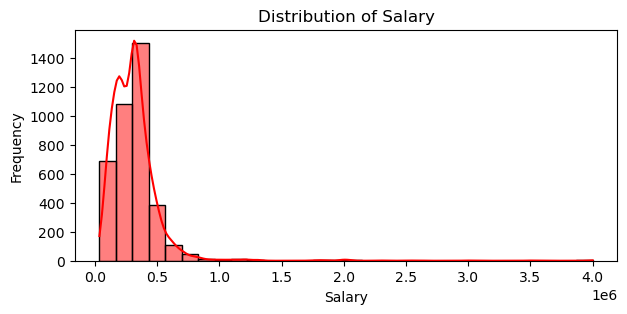

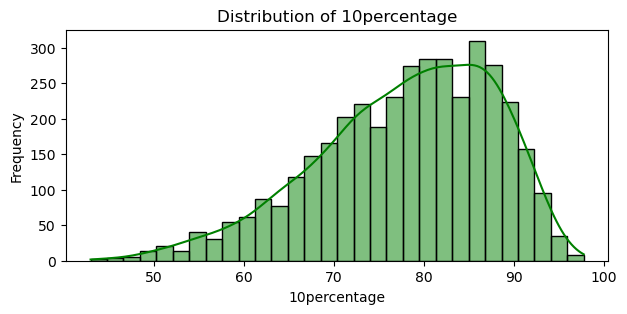

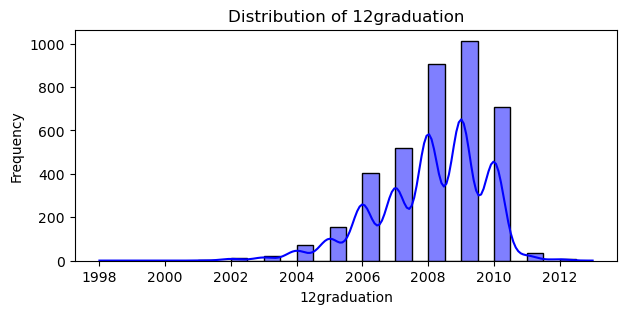

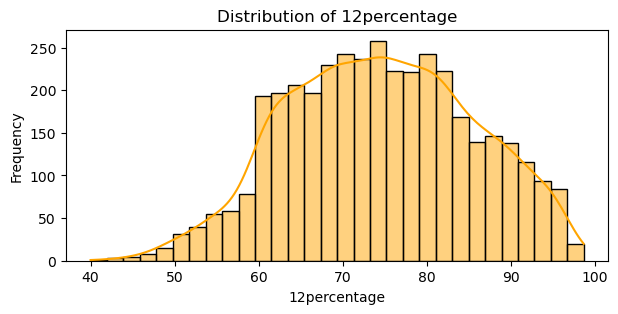

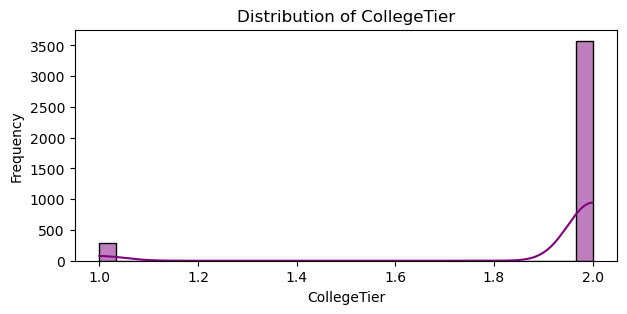

...

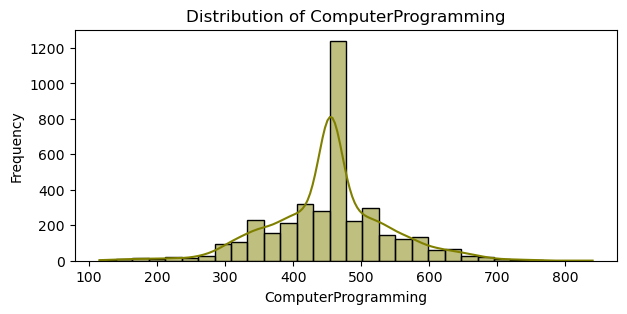

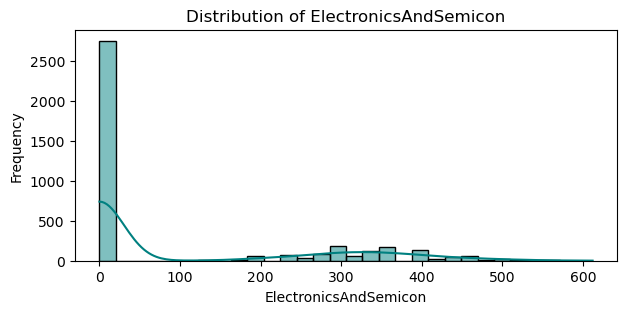

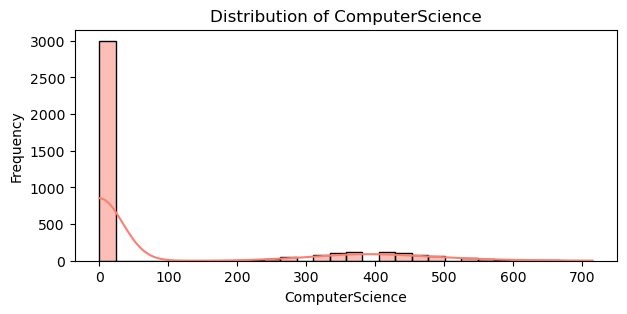

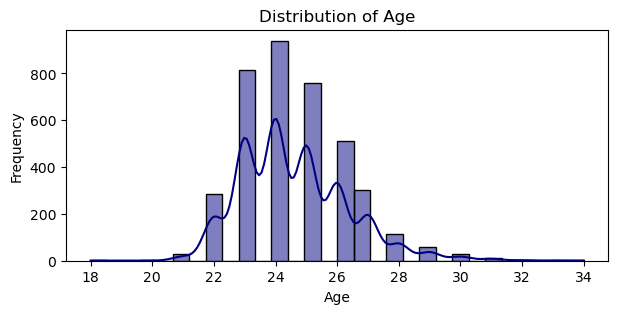

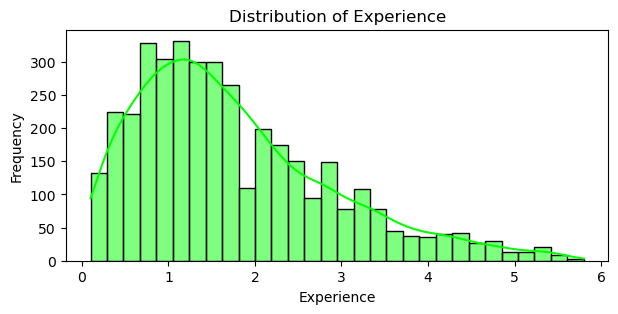

In [51]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta',
          'yellow', 'olive', 'teal', 'salmon', 'navy', 'lime', 'indigo']

# Loop through numerical columns and plot histograms with different colors
for col, color in zip(numerical_col, colors):
    plt.figure(figsize=(7, 3))
    sns.histplot(df1[col], kde=True, bins=30, color=color)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

#### `Conclution : `Each Histogram represents the distribution of values in a specific numerical column. 

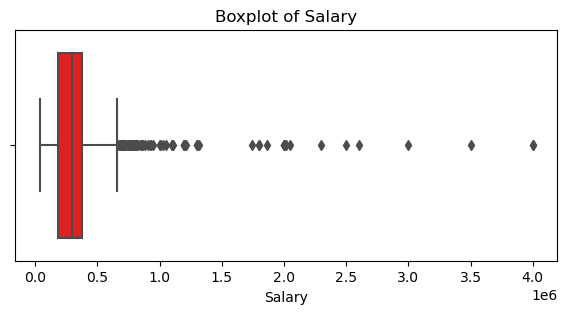

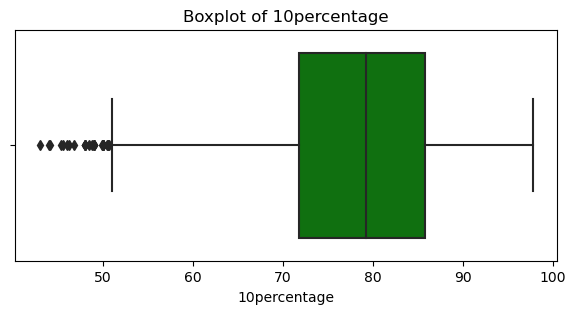

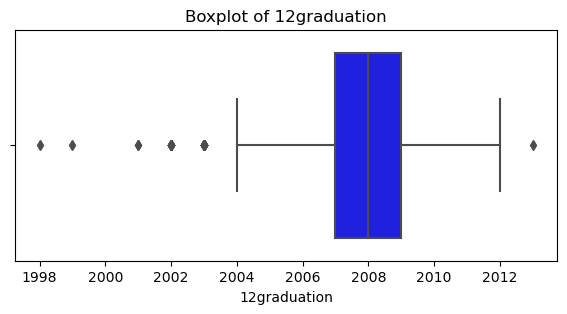

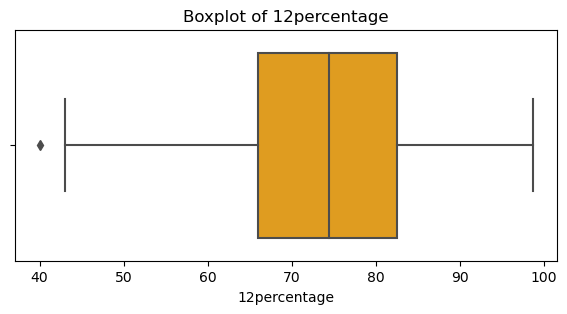

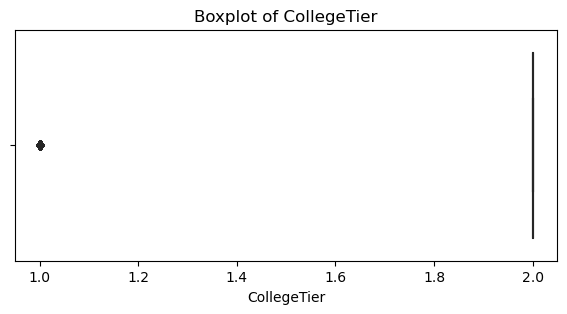

...

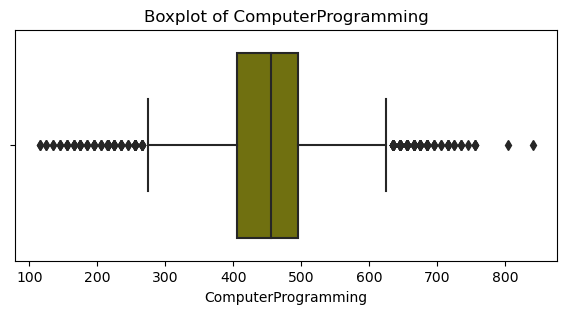

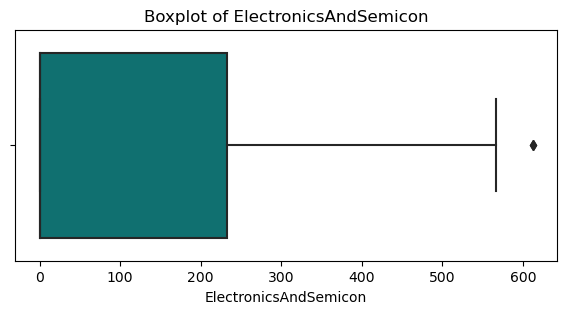

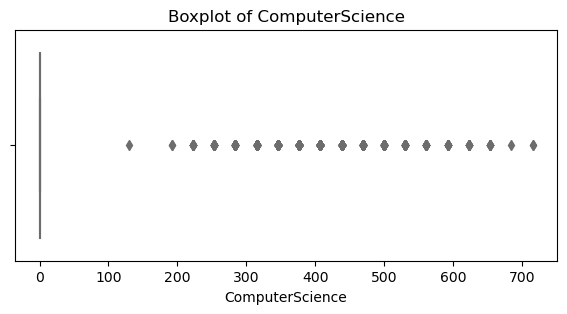

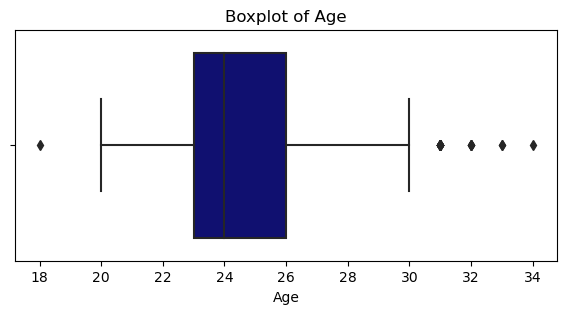

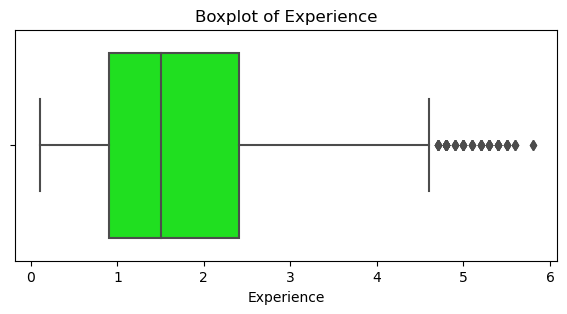

In [52]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta',
          'yellow', 'olive', 'teal', 'salmon', 'navy', 'lime', 'indigo']

# Loop through numerical columns and plot boxplots with different colors
for col, color in zip(numerical_col, colors):
    plt.figure(figsize=(7, 3))
    sns.boxplot(x=df1[col], color=color)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

#### `Conclution : `We can see here each Box plot represents outleirs and  there are  few columns have outliers. 

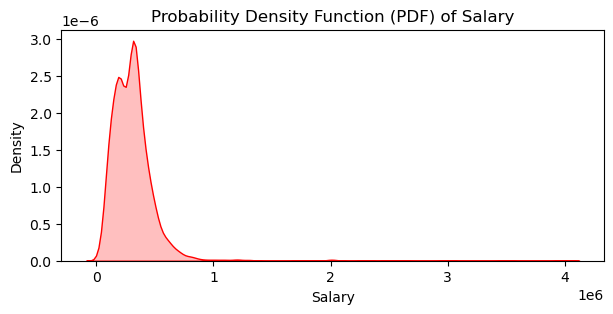

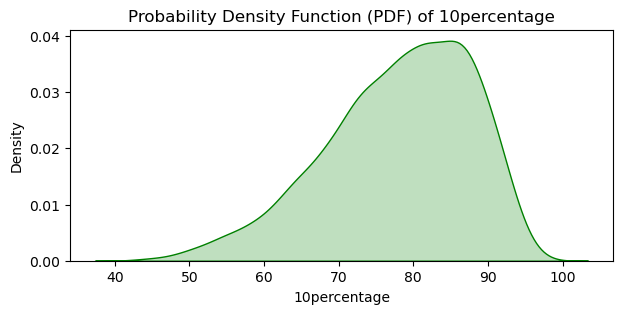

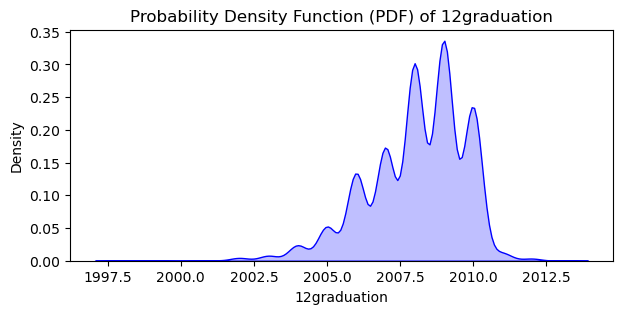

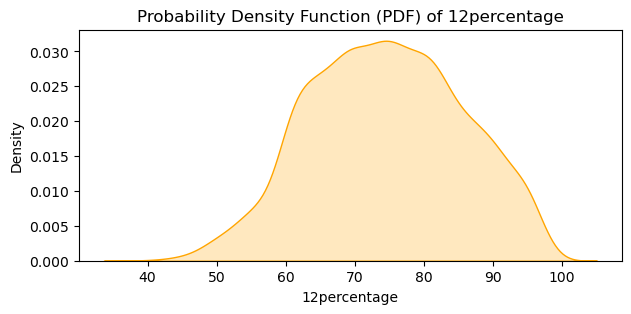

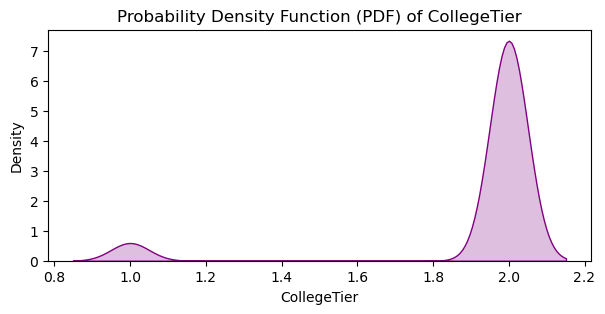

...

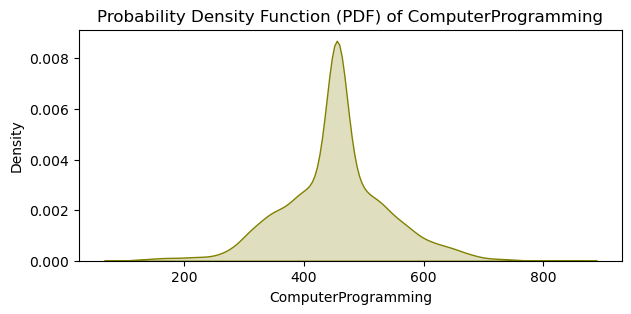

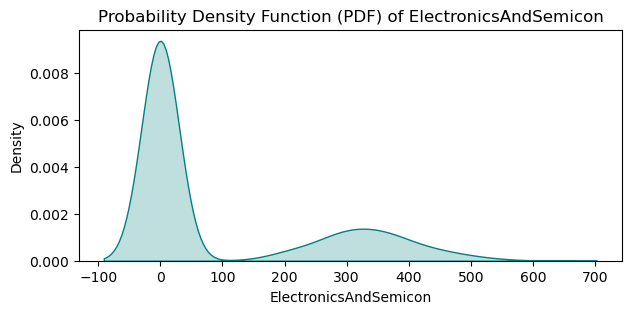

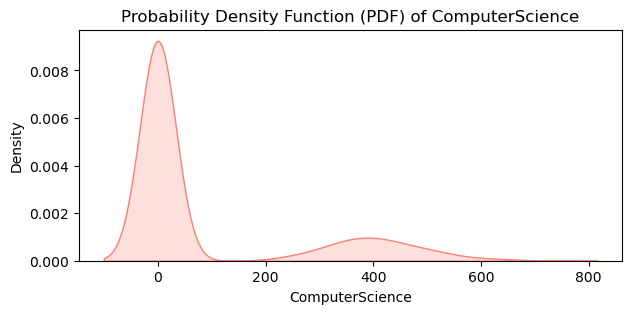

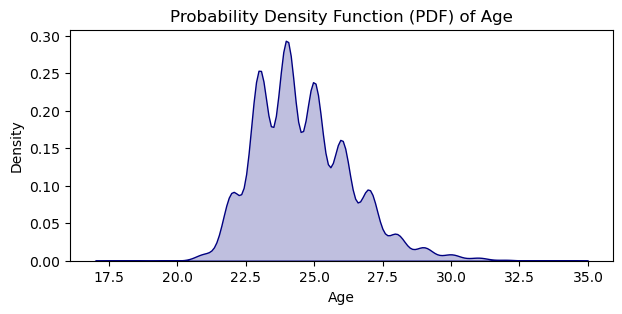

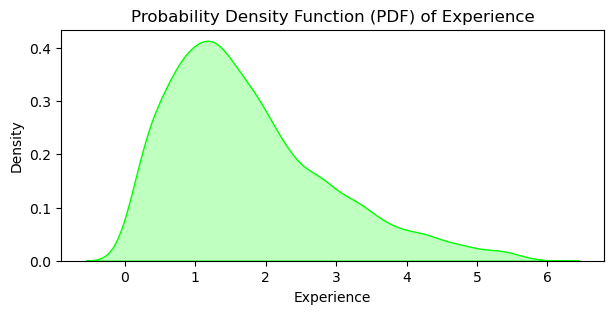

In [53]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta',
          'yellow', 'olive', 'teal', 'salmon', 'navy', 'lime', 'indigo']

# Loop through numerical columns and plot KDE plots with different colors
for col, color in zip(numerical_col, colors):
    plt.figure(figsize=(7, 3))
    sns.kdeplot(df1[col], fill=True, color=color)
    plt.title(f'Probability Density Function (PDF) of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

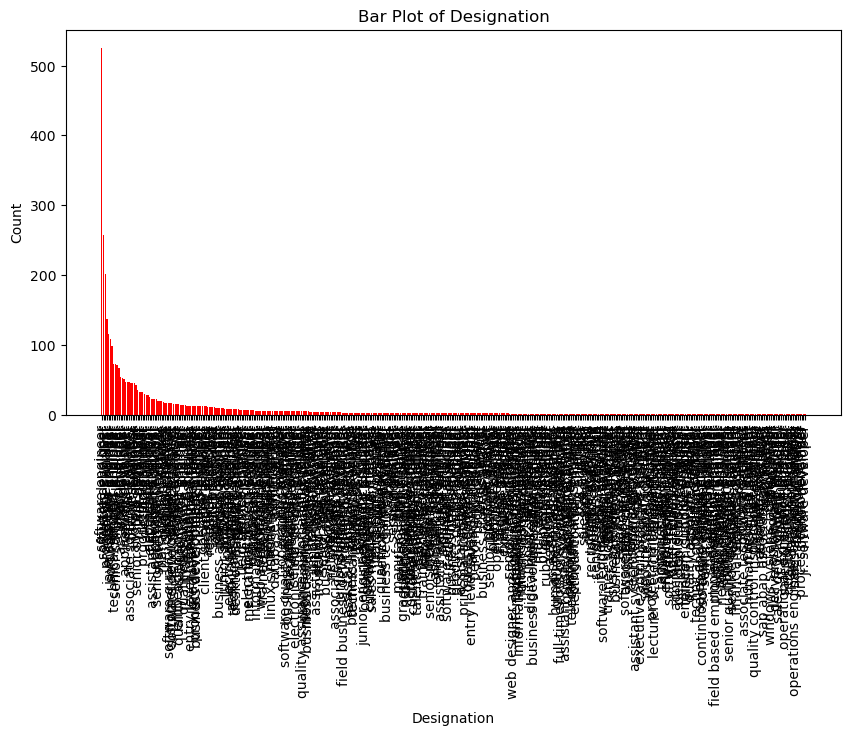

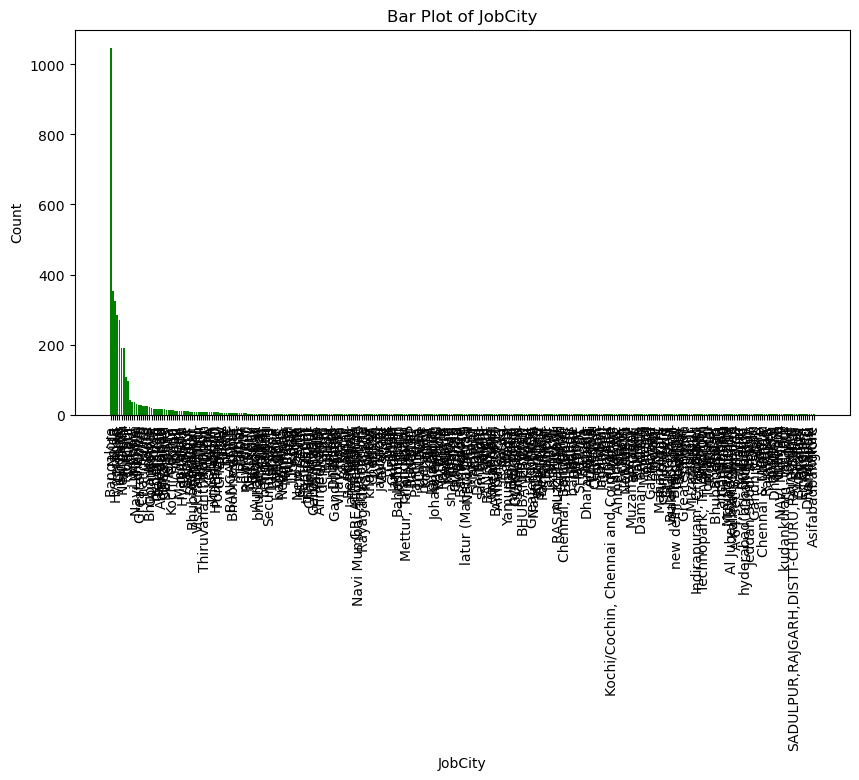

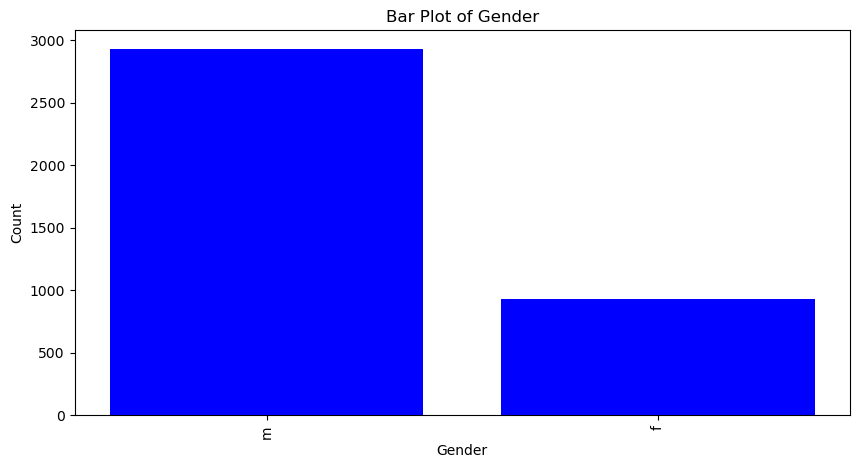

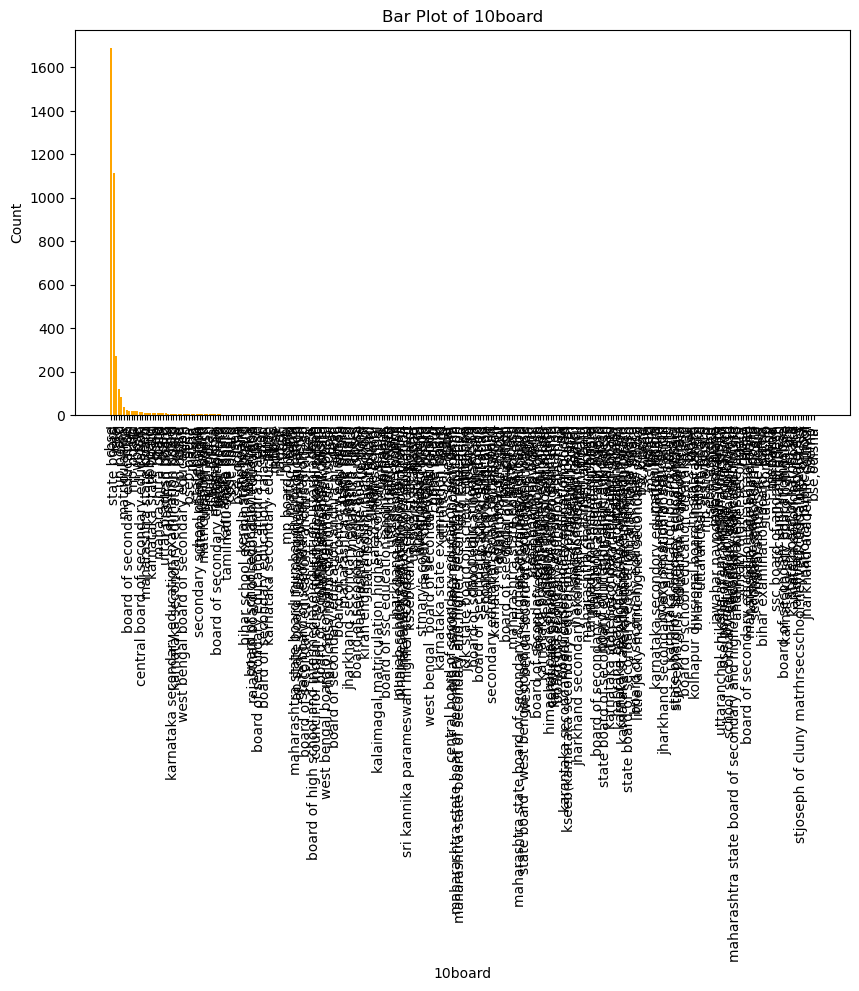

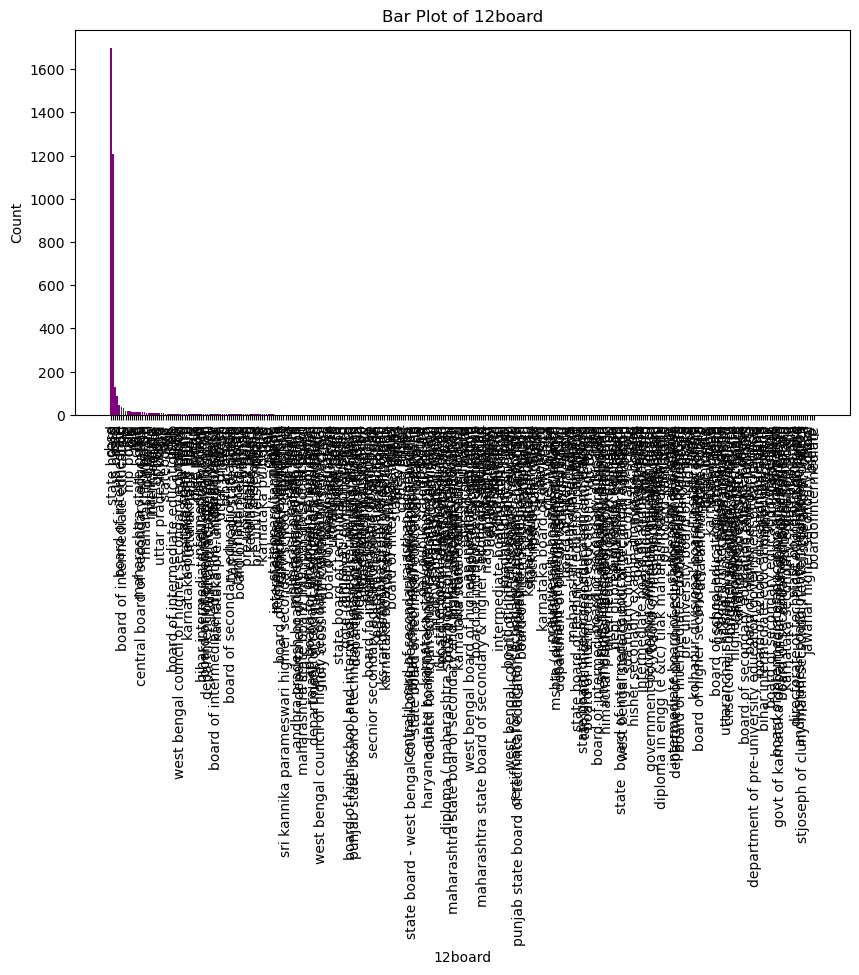

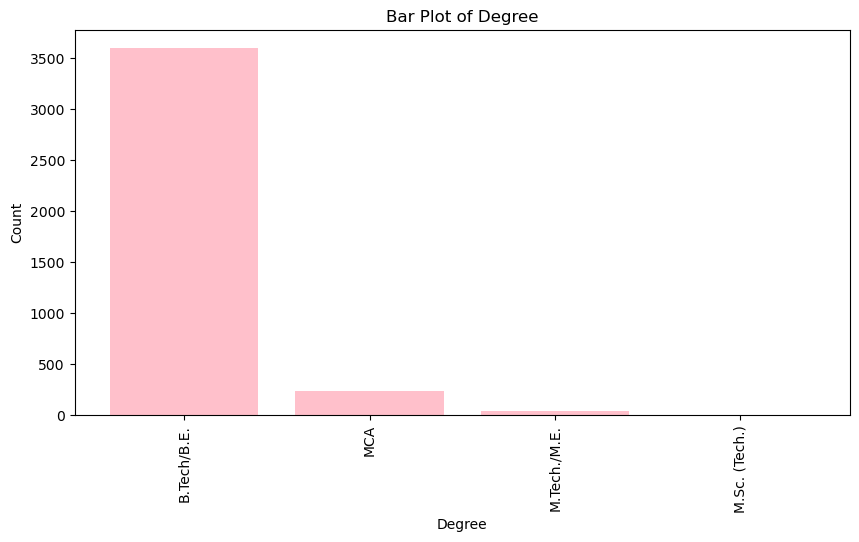

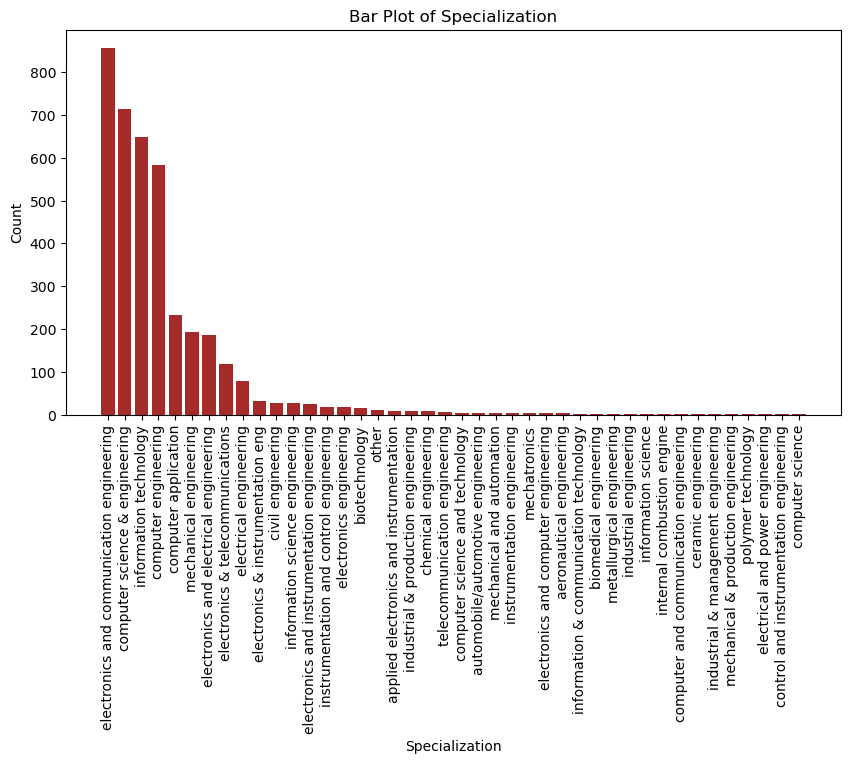

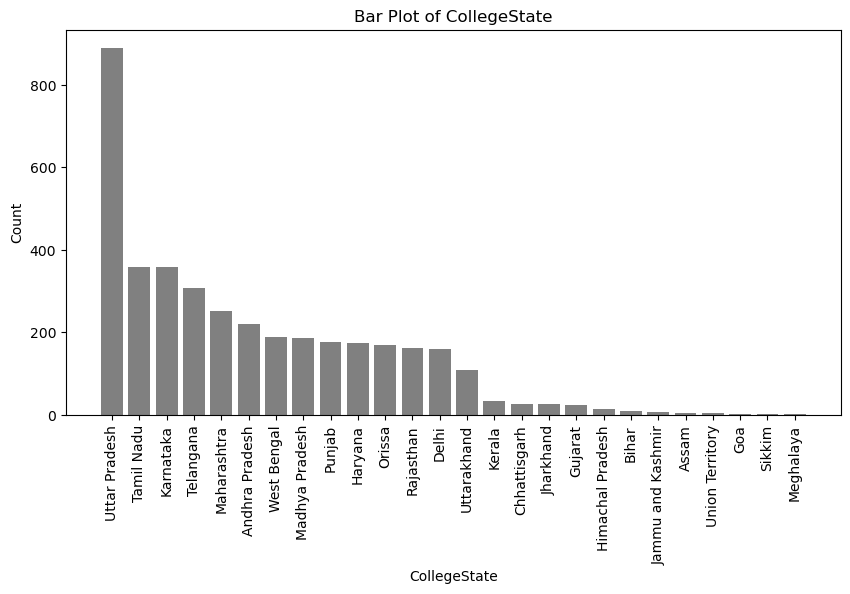

In [54]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta']

# Loop through categorical columns and plot bar plots with different colors
for col, color in zip(object_col, colors):
    plt.figure(figsize=(10, 5))
    value_counts = df1[col].value_counts()
    plt.bar(value_counts.index, value_counts, color=color)
    plt.title(f'Bar Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()

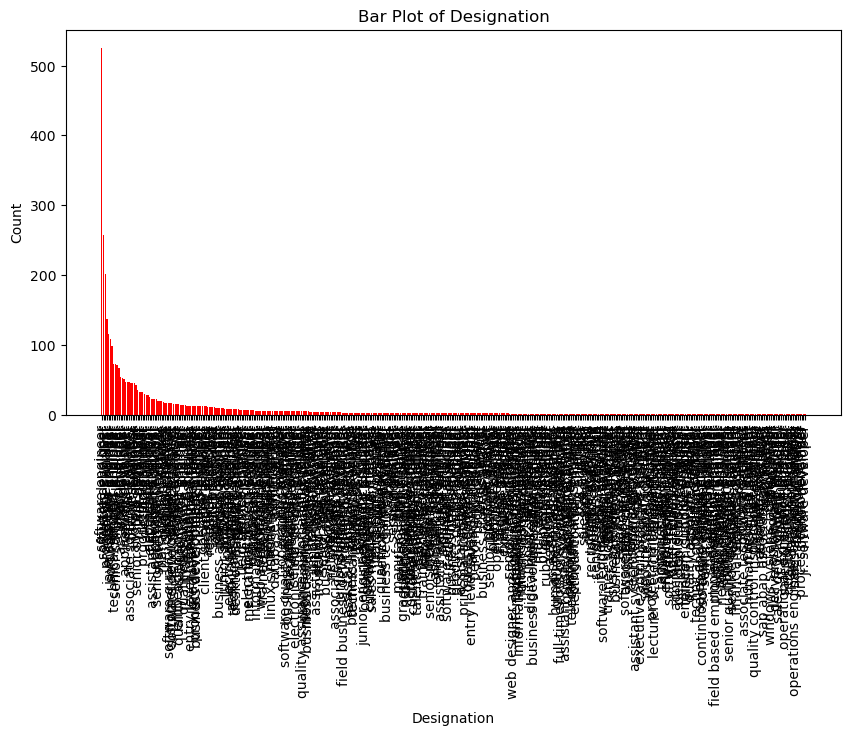

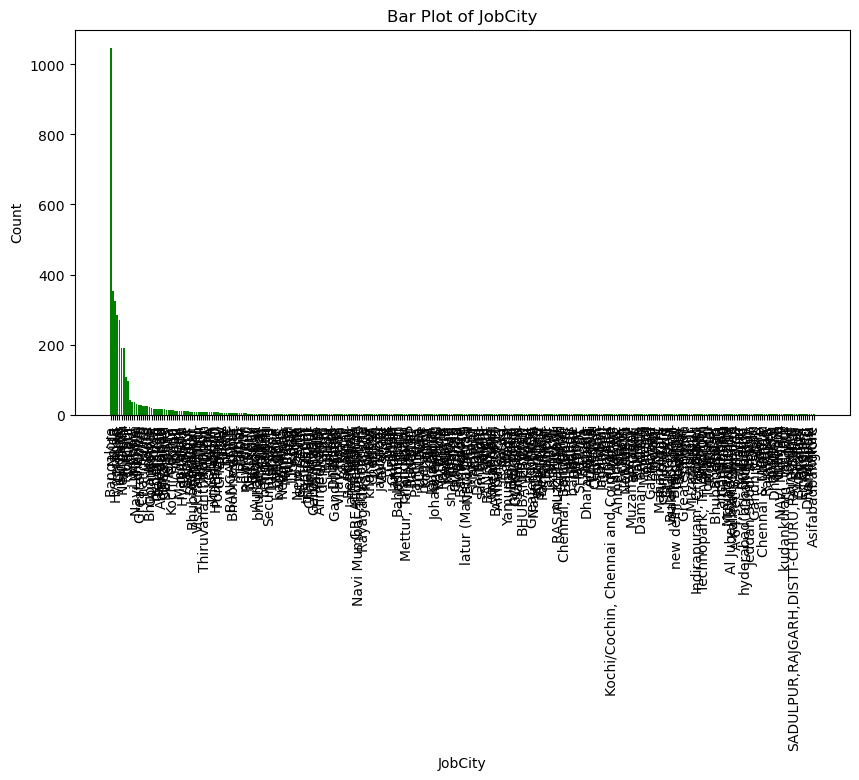

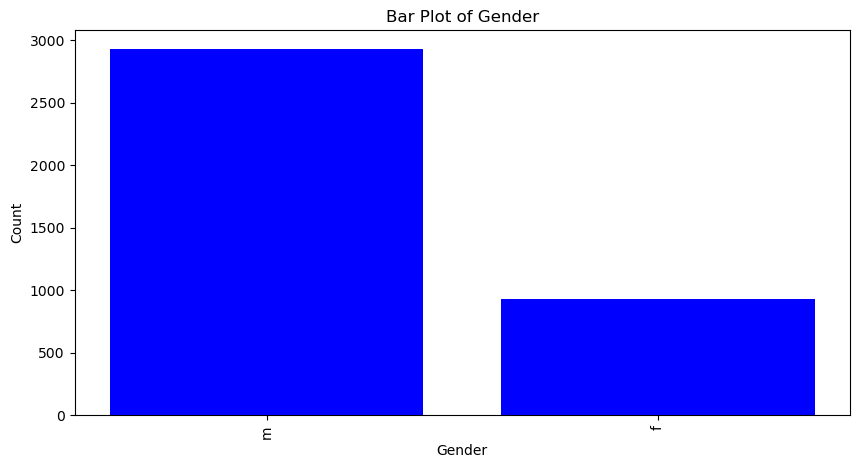

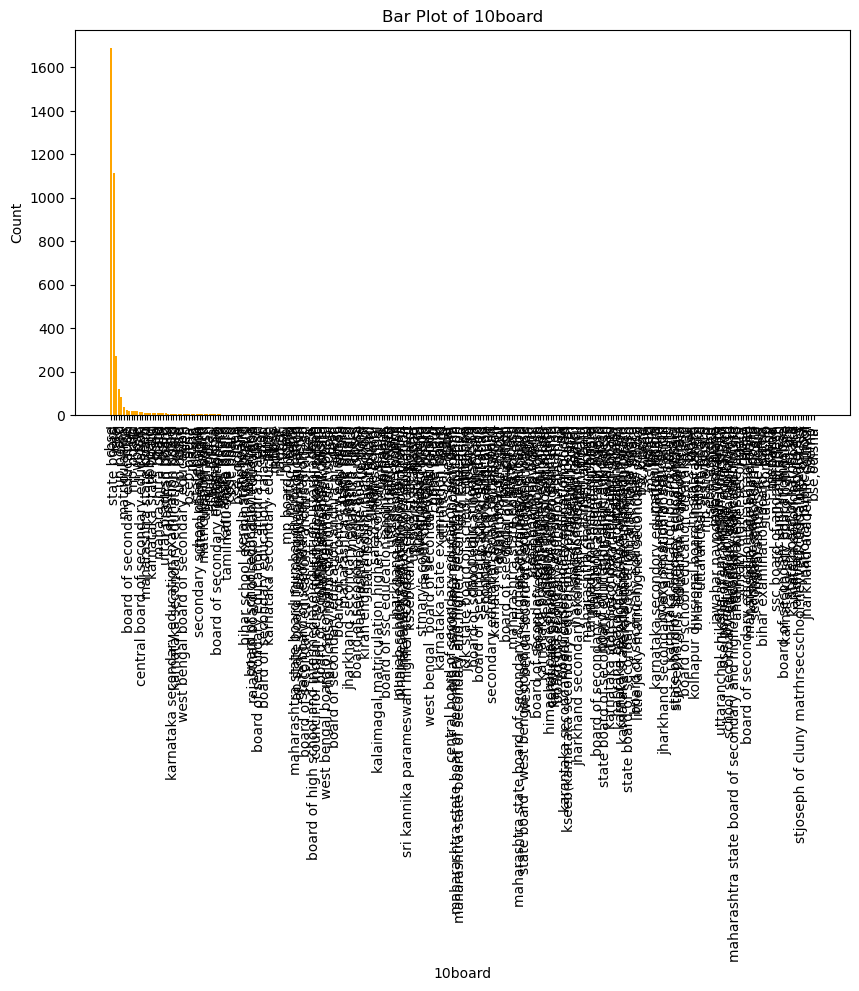

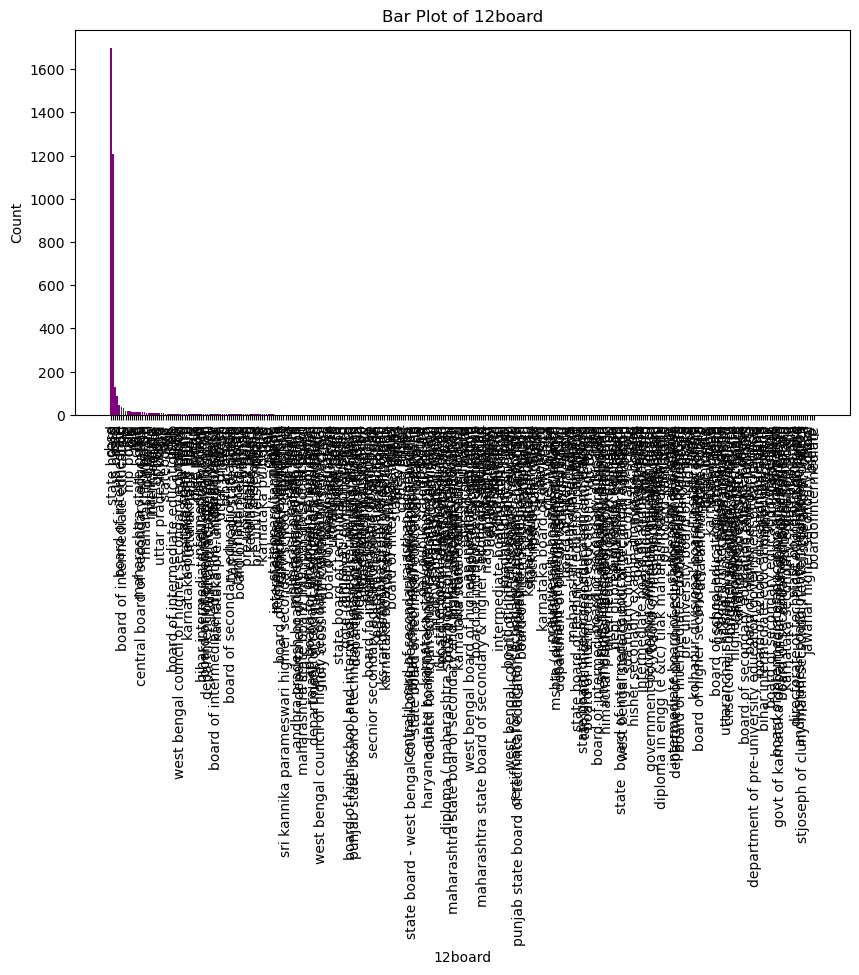

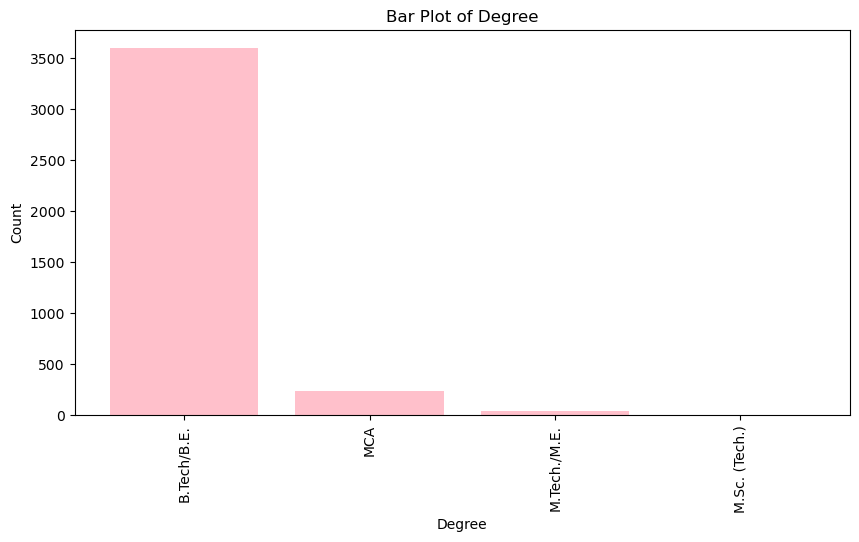

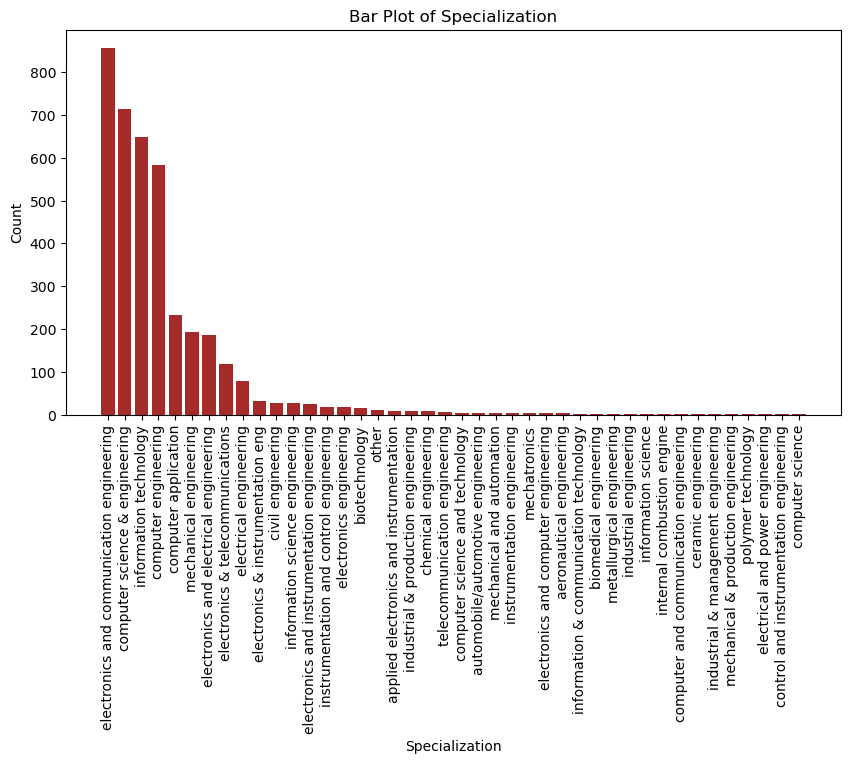

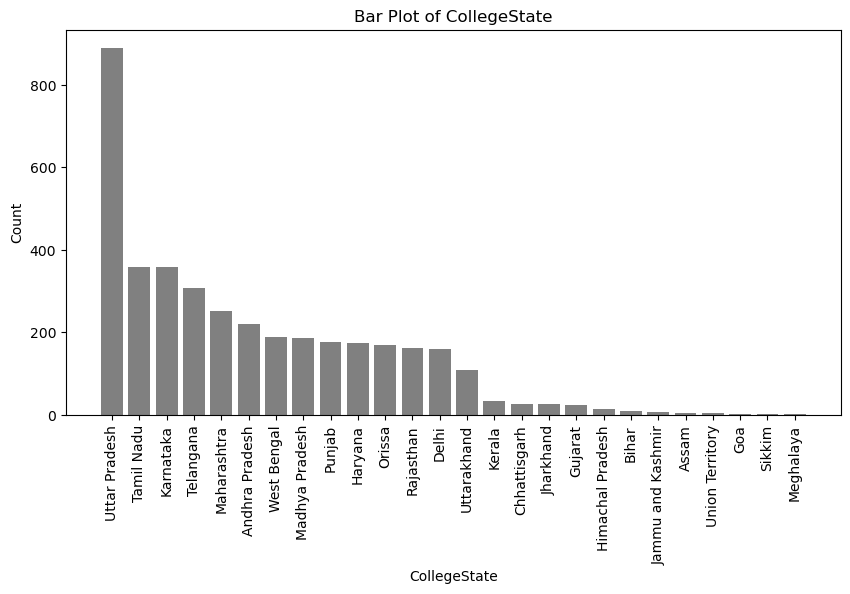

In [55]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta']

# Loop through categorical columns and plot bar plots with different colors
for col, color in zip(object_col, colors):
    plt.figure(figsize=(10, 5))
    value_counts = df1[col].value_counts()
    plt.bar(value_counts.index, value_counts, color=color)
    plt.title(f'Bar Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=90)
    plt.show()

In [55]:
# to get highest top 10 designation  by count
designation_top = df1["Designation"].value_counts().nlargest(10).sort_values()
#designation_top

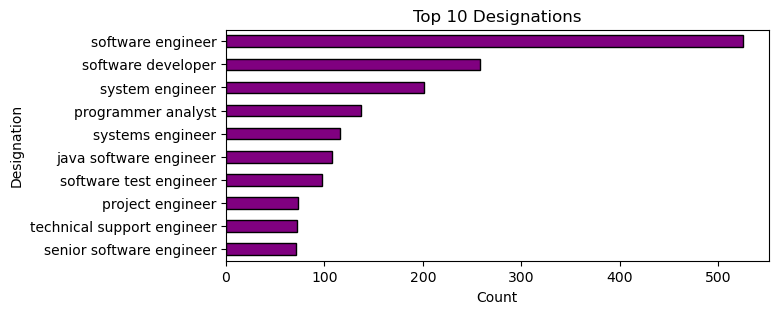

In [56]:
# top 10 designation bar plot
plt.figure(figsize=(7, 3))
designation_top.plot(kind = 'barh', color = 'purple', edgecolor = 'black')
plt.title('Top 10 Designations')
plt.xlabel('Count')
plt.ylabel('Designation')
plt.show()

#### `Conclution : `Here, it is evident that the most common designation is 'Software Engineer,' followed by 'Software Developer' and 'System Engineer.'

In [57]:
# to get highest top 10 designation  by count
jobcity_top = df1["JobCity"].value_counts().nlargest(10).sort_values()
#jobcity_top

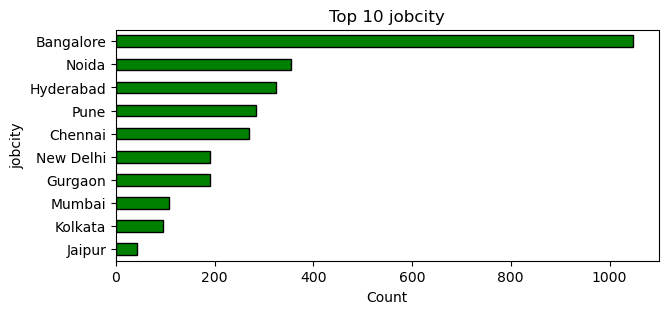

In [58]:
# top 10 designation bar plot
plt.figure(figsize=(7, 3))
jobcity_top.plot(kind = 'barh', color = 'green', edgecolor = 'black')
plt.title('Top 10 jobcity')
plt.xlabel('Count')
plt.ylabel('jobcity')
 # Rotate x-axis labels for better readability
plt.show()

#### `Conclution : `Here, it is clear that the city with the highest job count is Bangalore, followed by Noida and Hyderabad.

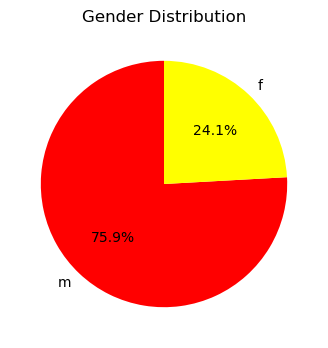

In [59]:
gender_counts = df1["Gender"].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90, colors=['red', 'yellow'])
plt.title('Gender Distribution')
plt.show()

#### `Conclution : `Here, it is evident that the male gender has a larger representation than the female gender.

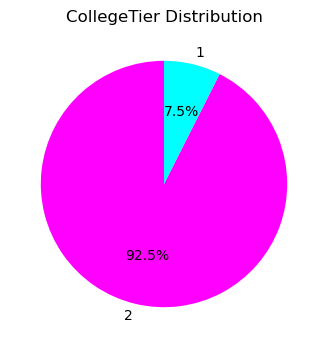

In [60]:
collegetier_counts = df1["CollegeTier"].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(collegetier_counts, labels=collegetier_counts.index, autopct='%1.1f%%', startangle=90, colors=['magenta','cyan'])
plt.title('CollegeTier Distribution')
plt.show()

#### `Conclution : `Here, it is clear that the highest representation is from colleges with Tier 2 ranking compared to Tier 1.

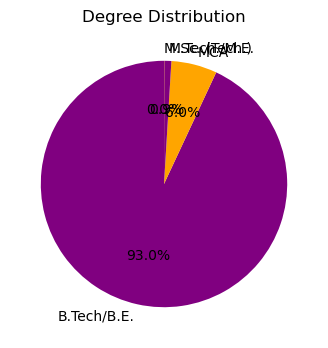

In [61]:
Degree_counts = df1["Degree"].value_counts()

plt.figure(figsize=(4, 4))
plt.pie(Degree_counts, labels=Degree_counts.index, autopct='%1.1f%%', startangle=90, colors=['purple', 'orange'])
plt.title('Degree Distribution')
plt.show()

#### `Conclution : `Here, it is clear that the highest representation is from individuals with a 'Degree' of B.Tech/B.E.

### `Our target column is 'Salary,' and let's conduct some analysis on this 'Salary' column`

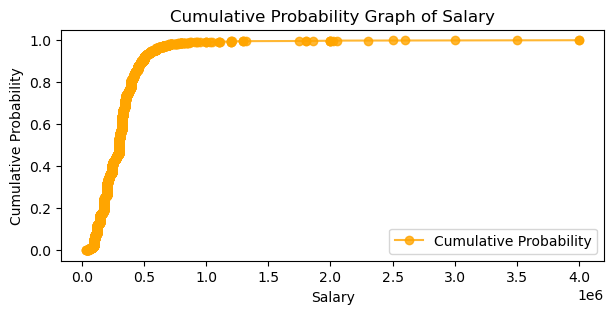

In [62]:
salary_values = df1["Salary"].sort_values()

# Calculate the cumulative distribution
cumulative_prob = np.arange(1, len(salary_values) + 1) / len(salary_values)

# Create a line plot for the cumulative distribution
plt.figure(figsize=(7, 3))
plt.plot(salary_values, cumulative_prob, marker = 'o', color="orange", alpha = 0.8, label="Cumulative Probability")
plt.title("Cumulative Probability Graph of Salary")
plt.xlabel("Salary")
plt.ylabel("Cumulative Probability")
plt.legend()
plt.show()

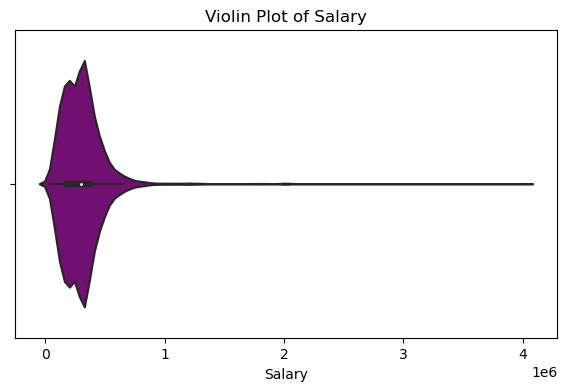

In [63]:
plt.figure(figsize=(7, 4))
sns.violinplot(x=df1["Salary"], color="purple")
plt.title("Violin Plot of Salary")
plt.xlabel("Salary")
plt.show()

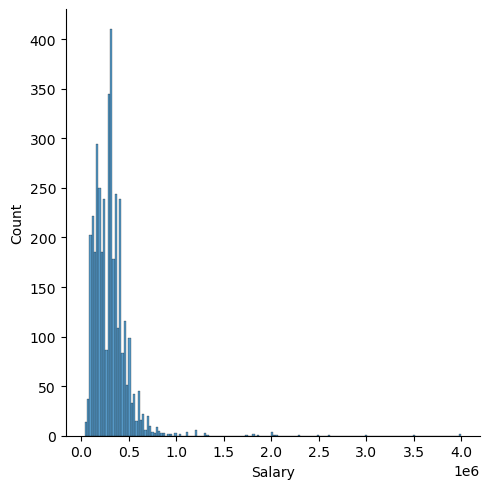

In [64]:
sns.displot(df1["Salary"])

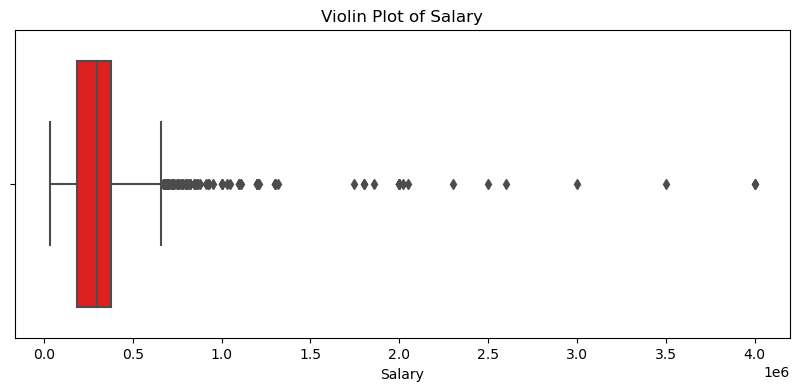

In [65]:
plt.figure(figsize=(10, 4))
sns.boxplot(x=df1["Salary"], color="red")
plt.title("Violin Plot of Salary")
plt.xlabel("Salary")
plt.show()

#### `Conclution : `From the above graph, we observe the presence of an outlier where salaries exceeding 10,00,000 are rare, particularly in the first job.

### `Finding outliers by mathematically inpection`

In [115]:
Q1 = df1["Salary"].quantile(0.25)
Q1

180000.0

In [116]:
Q3 = df1["Salary"].quantile(0.75)
Q3

360000.0

In [117]:
IQR = Q3 - Q1
IQR

180000.0

In [118]:
outliers = (Q1 - 1.5*IQR), (Q3 + 1.5*IQR) 
outliers

(-90000.0, 630000.0)

In [119]:
lower_boundary = Q1 - (1.5*IQR)
lower_boundary

-90000.0

In [120]:
upper_boundary = Q3 + (1.5*IQR)
upper_boundary

630000.0

In [121]:
outliers = df1[( df1["Salary"] < lower_boundary) | ( df1["Salary"] > upper_boundary)]
outliers

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,Age,Experience
114,640000.0,2010-04-01,2015-12-31,programmer analyst,Bangalore,m,1987-04-24,78.00,cbse,2004,...,2009.0,455,605,625,0.916870,555.0,0,0,28,5.8
177,660000.0,2011-09-01,2015-12-31,senior software developer,Pune,m,1988-02-05,78.00,cbse,2005,...,2011.0,465,515,615,0.819417,505.0,0,0,27,4.3
614,655000.0,2011-07-01,2015-12-31,senior software engineer,Bangalore,m,1989-03-29,88.50,icse,2007,...,2011.0,505,605,675,0.960603,455.0,466,0,26,4.5
681,645000.0,2011-09-01,2015-12-31,android developer,Lucknow,m,1988-09-15,73.50,up board,2005,...,2011.0,485,375,585,0.819417,505.0,0,0,27,4.3
743,645000.0,2011-07-01,2015-12-31,technology lead,Mangalore,m,1989-06-04,86.60,cbse,2007,...,2011.0,605,545,565,0.862625,524.0,0,0,26,4.5
1253,650000.0,2011-12-01,2015-12-31,database administrator,Hyderabad,m,1990-03-07,79.80,ssc,2007,...,2011.0,435,335,405,0.143257,295.0,300,0,25,4.1
1312,650000.0,2011-06-01,2015-12-31,it business analyst,Bangalore,m,1987-06-01,77.50,cbse,2005,...,2011.0,345,455,435,0.600057,435.0,0,0,28,4.6
1313,650000.0,2010-07-01,2012-10-01,assistant manager,Bangalore,m,1988-07-31,88.60,cbse,2006,...,2010.0,485,585,565,0.694479,454.0,366,0,27,2.3
1777,650000.0,2011-11-01,2015-12-31,technology analyst,Hyderabad,m,1989-01-19,88.00,cbse,2006,...,2011.0,705,625,625,0.997428,705.0,0,0,26,4.2
1847,650000.0,2012-02-01,2015-12-31,senior software engineer,Hyderabad,m,1989-07-18,81.83,board of secondary education,2006,...,2010.0,375,355,565,0.910770,315.0,433,0,26,3.9


In [122]:
outliers.index

Int64Index([ 114,  177,  614,  681,  743, 1253, 1312, 1313, 1777, 1847, 1996,
            2009, 2393, 2669, 3149, 3174, 3427, 3608, 3659, 3692, 3753, 3946],
           dtype='int64')

In [123]:
df1.drop(outliers.index, axis = 0, inplace = True)

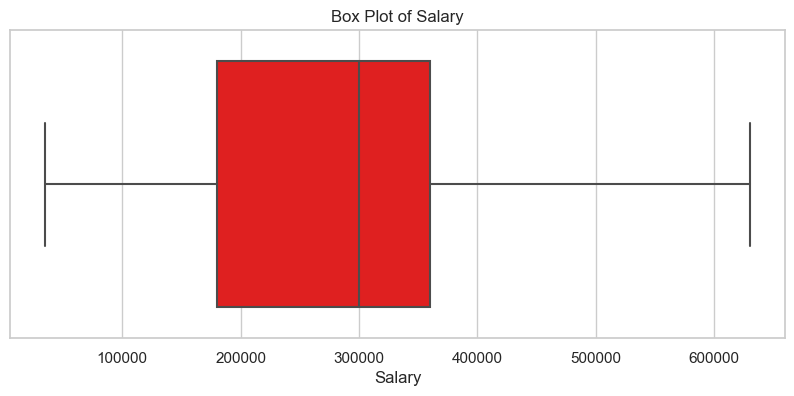

In [124]:
plt.figure(figsize=(10, 4))
sns.boxplot(x=df1["Salary"], color="red")
plt.title("Box Plot of Salary")
plt.xlabel("Salary")
plt.show()

#### `Conclution : `We observed the presence of outliers in the salary data, and as a result, we have decided to drop those data points.

# `Bivariate analysis`

In [76]:
df1.columns

Index(['Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeState',
       'GraduationYear', 'English', 'Logical', 'Quant', 'Domain',
       'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience',
       'Age', 'Experience'],
      dtype='object')

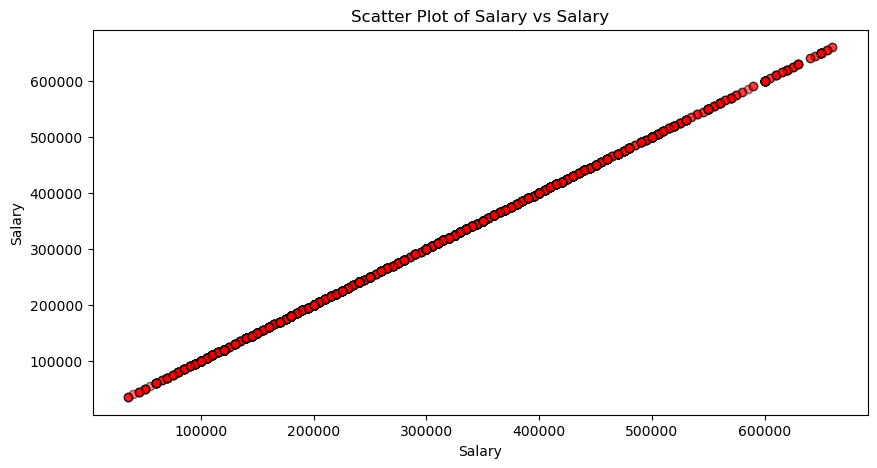

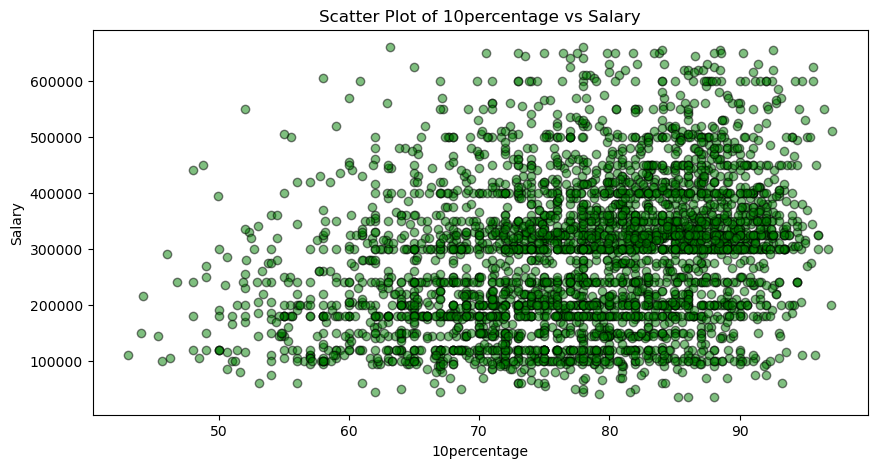

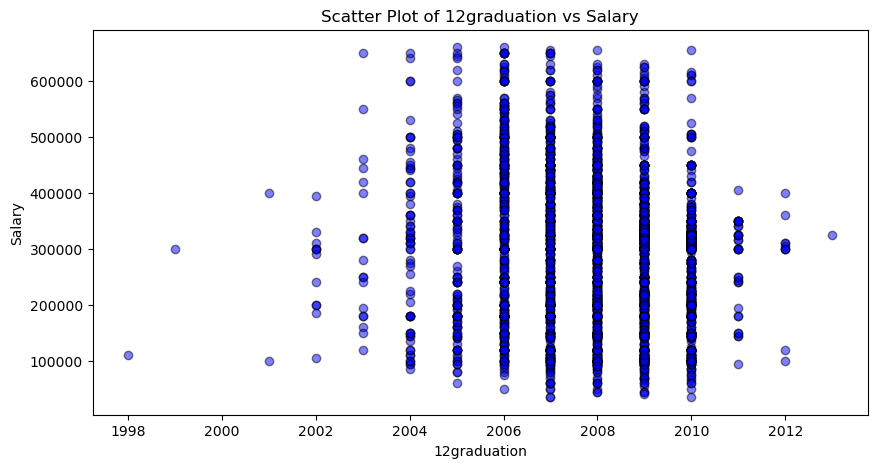

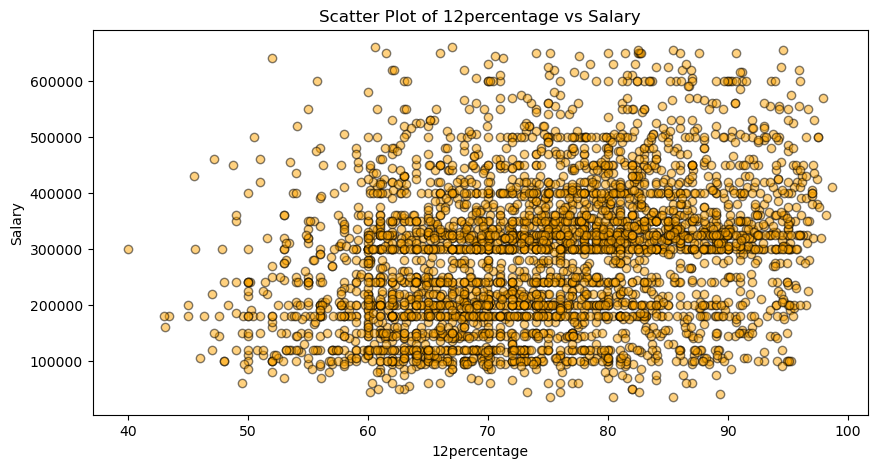

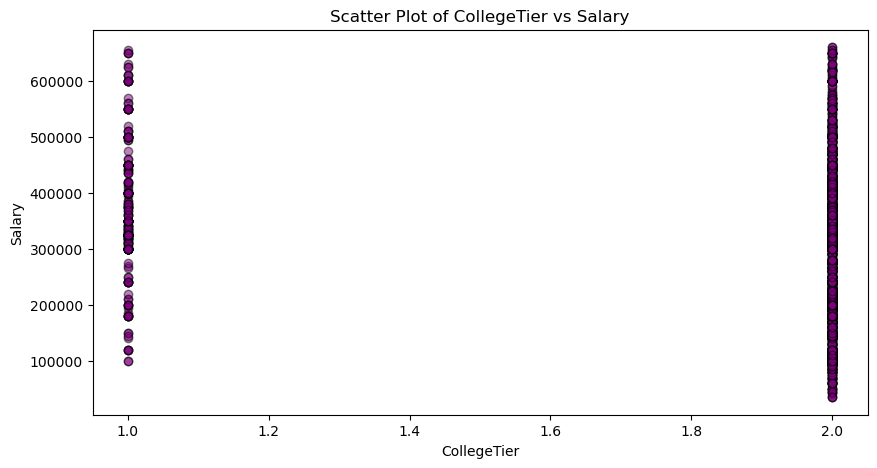

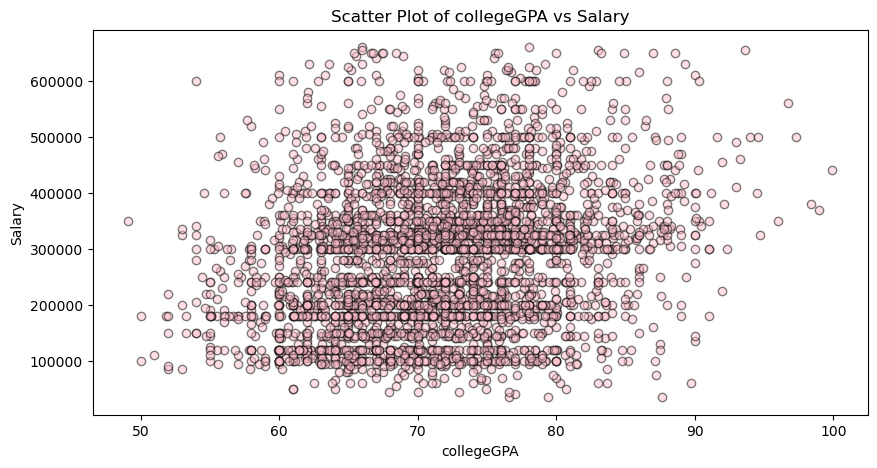

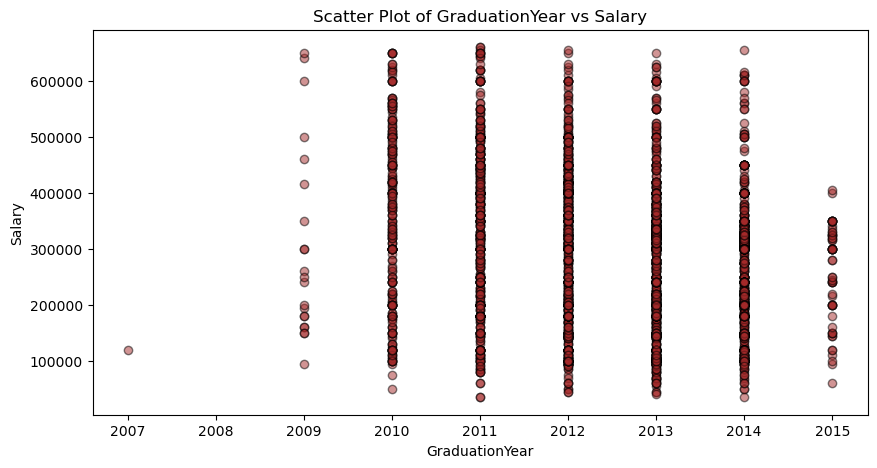

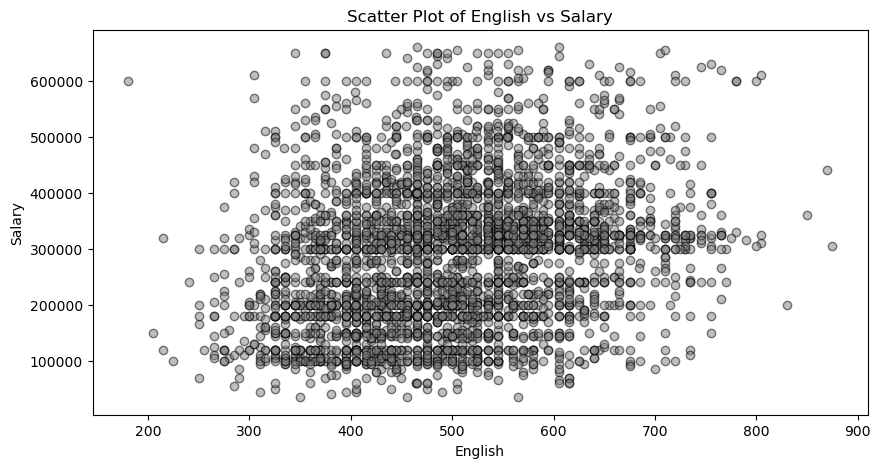

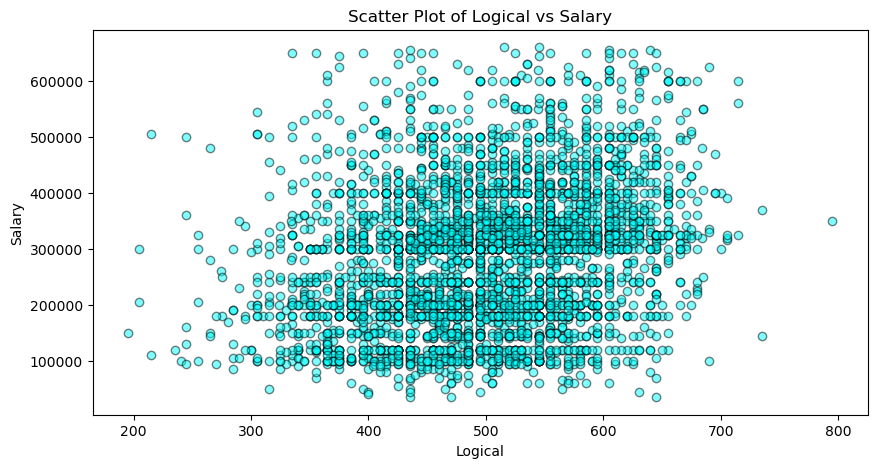

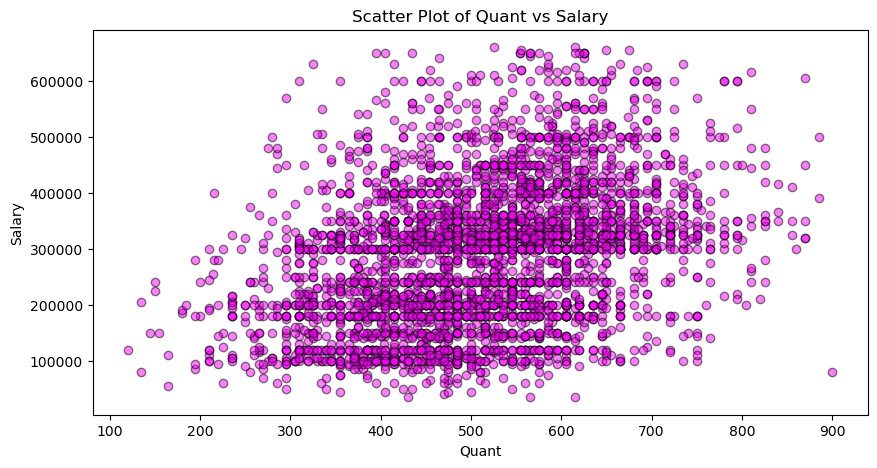

In [77]:
# Predefined list of colors
colors = ['red', 'green', 'blue', 'orange', 'purple', 'pink', 'brown', 'gray', 'cyan', 'magenta']

# Loop through numerical columns and plot scatter plots with different colors
for col, color in zip(numerical_col, colors):
    plt.figure(figsize=(10, 5))
    plt.scatter(df1[col], df1['Salary'], color=color,ec='k', alpha=0.5)
    plt.title(f'Scatter Plot of {col} vs Salary')
    plt.xlabel(col)
    plt.ylabel('Salary')
    plt.show()

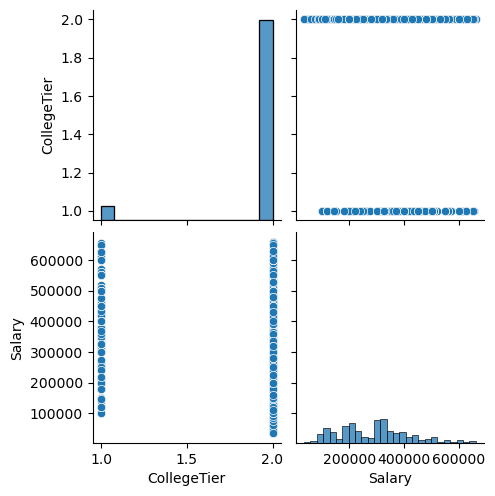

In [78]:
sns.pairplot(df1, vars = ["CollegeTier", "Salary"])

<Axes: xlabel='Gender', ylabel='Salary'>

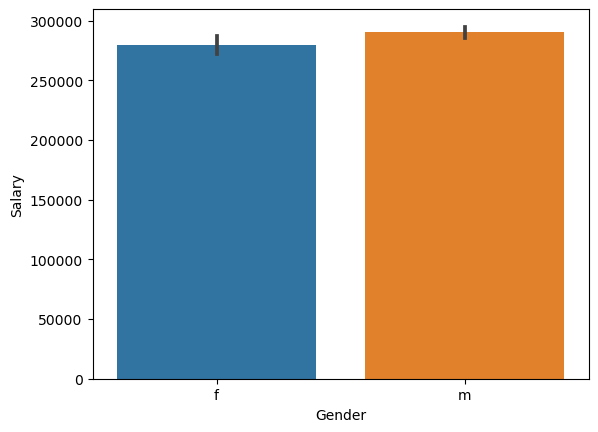

In [79]:
sns.barplot(x =df1["Gender"], y = df1["Salary"])

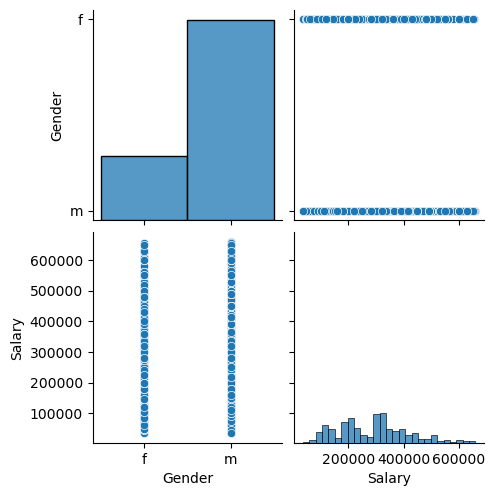

In [80]:
sns.pairplot(df1, vars = ["Gender", "Salary"])

#### `Conclution : `Here we can see Males and females take the same salary.

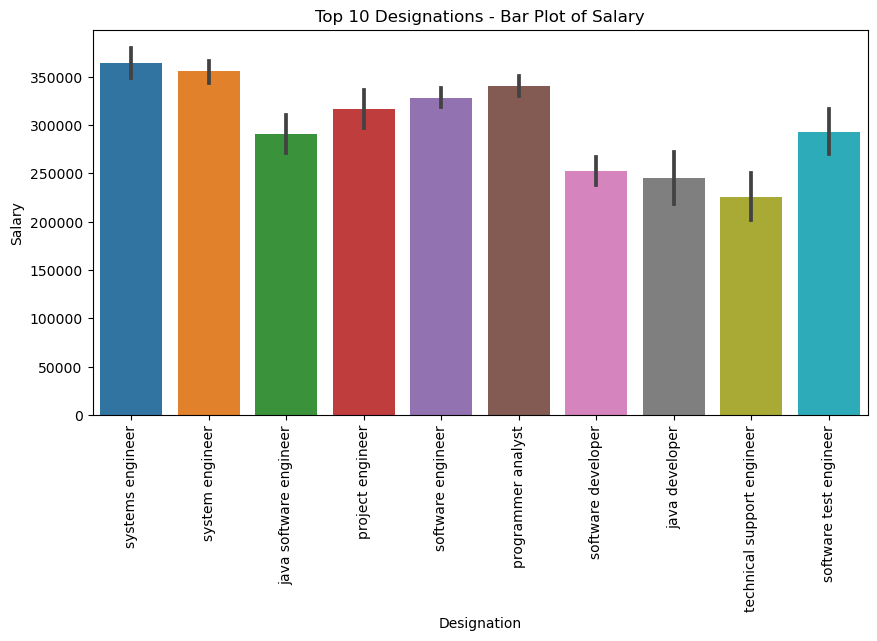

In [81]:
# Get the top 10 designations
top_designations = df1['Designation'].value_counts().head(10).index

# Filter the data to include only the top 10 designations
filtered_df = df1[df1['Designation'].isin(top_designations)]

# Check if the filtered DataFrame is not empty
if not filtered_df.empty:
    # Create the bar plot
    plt.figure(figsize=(10, 5))
    sns.barplot(x="Designation", y="Salary", data=filtered_df)
    plt.title('Top 10 Designations - Bar Plot of Salary')
    plt.xlabel('Designation')
    plt.ylabel('Salary')
    plt.xticks(rotation=90)
    plt.show()
else:
    print("No data for the top 10 designations.")

#### `Conclution : `Here we can see System Engineer receives a higher salary compared to other job designations.

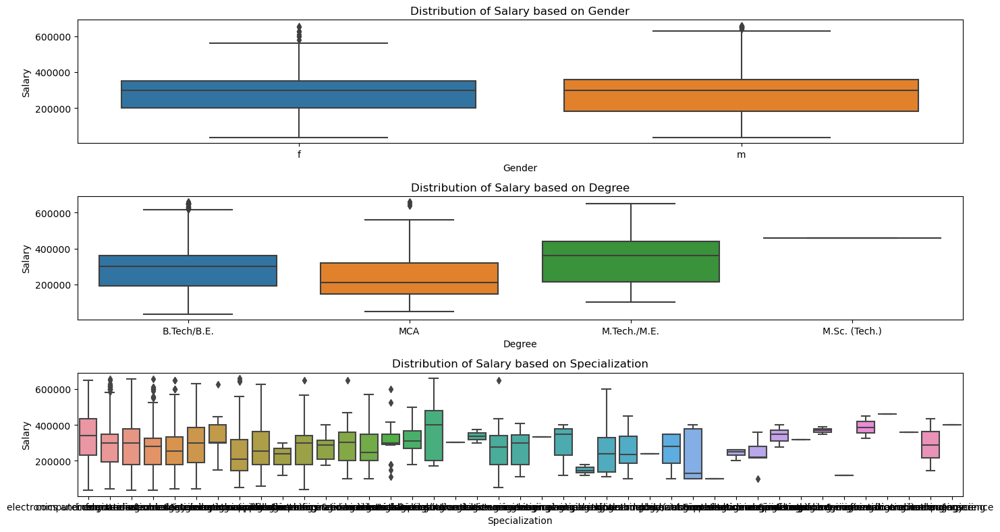

In [82]:
plt.figure(figsize=(15, 8))

# Distribution of salary based on Gender
plt.subplot(3, 1, 1)
sns.boxplot(x='Gender', y='Salary', data=df1)
plt.title('Distribution of Salary based on Gender')

# Distribution of salary based on Degree
plt.subplot(3, 1, 2)
sns.boxplot(x='Degree', y='Salary', data=df1)
plt.title('Distribution of Salary based on Degree')

# Distribution of salary based on Specialization
plt.subplot(3, 1, 3)
sns.boxplot(x='Specialization', y='Salary', data=df1)
plt.title('Distribution of Salary based on Specialization')

plt.tight_layout()
plt.show()

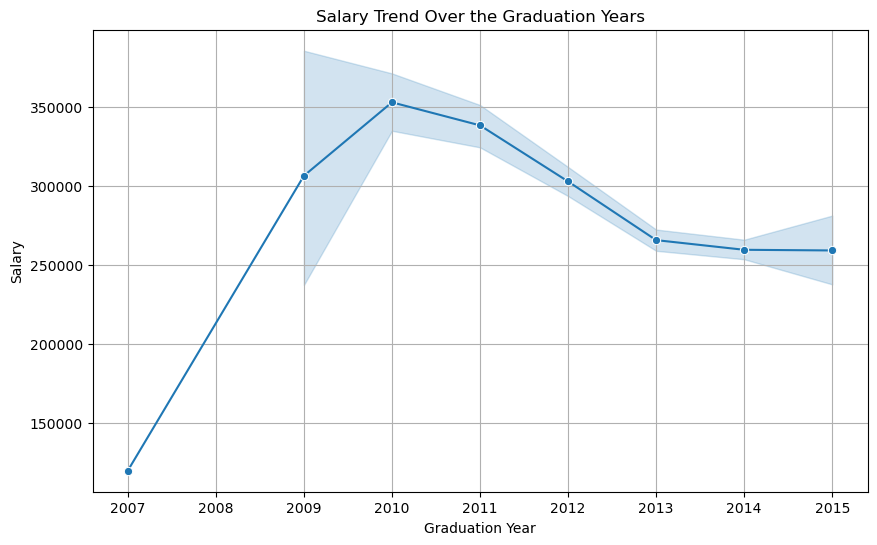

In [83]:

plt.figure(figsize=(10, 6))
sns.lineplot(x='GraduationYear', y='Salary', data=df1, marker='o')
plt.title('Salary Trend Over the Graduation Years')
plt.xlabel('Graduation Year')
plt.ylabel('Salary')
plt.grid(True)
plt.show()

In [84]:

# Group by different categories and calculate the average salary
average_salary_by_gender = df.groupby('Gender')['Salary'].mean()
average_salary_by_college_tier = df.groupby('CollegeTier')['Salary'].mean()
average_salary_by_degree = df.groupby('Degree')['Salary'].mean()

# Display the results
print("Average Salary by Gender:\n", average_salary_by_gender)
print("*"*35)
print("\nAverage Salary by College Tier:\n", average_salary_by_college_tier)
print("*"*35)
print("\nAverage Salary by Degree:\n", average_salary_by_degree)


Average Salary by Gender:
 Gender
f    294937.304075
m    311716.211772
Name: Salary, dtype: float64
***********************************

Average Salary by College Tier:
 CollegeTier
1    442356.902357
2    296893.812483
Name: Salary, dtype: float64
***********************************

Average Salary by Degree:
 Degree
B.Tech/B.E.      308622.702703
M.Sc. (Tech.)    320000.000000
M.Tech./M.E.     366132.075472
MCA              280802.469136
Name: Salary, dtype: float64


In [85]:
# Group by college tier and calculate the average salary
average_salary_by_college_tier = df1.groupby('CollegeTier')['Salary'].mean()

# Display the results
print("Average Salary by College Tier:\n", average_salary_by_college_tier)

Average Salary by College Tier:
 CollegeTier
1    369921.568627
2    281601.254991
Name: Salary, dtype: float64


In [86]:
# Group by job city and calculate the average salary
average_salary_by_job_city = df1.groupby('JobCity')['Salary'].mean()

# Sort the result to highlight cities with higher average salaries
sorted_salary_by_job_city = average_salary_by_job_city.sort_values(ascending=False)

# Display the results
print("Average Salary by Job City:\n", sorted_salary_by_job_city)

Average Salary by Job City:
 JobCity
Jhajjar             620000.0
Sambalpur           610000.0
Rayagada, Odisha    600000.0
patna               600000.0
jamnagar            600000.0
                      ...   
ahmedabad            80000.0
Bhubaneswar          80000.0
Trichur              75000.0
Muvattupuzha         65000.0
Howrah               60000.0
Name: Salary, Length: 316, dtype: float64


In [87]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3761 entries, 0 to 3997
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Salary                 3761 non-null   float64       
 1   DOJ                    3761 non-null   datetime64[ns]
 2   DOL                    3761 non-null   datetime64[ns]
 3   Designation            3761 non-null   object        
 4   JobCity                3761 non-null   object        
 5   Gender                 3761 non-null   object        
 6   DOB                    3761 non-null   datetime64[ns]
 7   10percentage           3761 non-null   float64       
 8   10board                3761 non-null   object        
 9   12graduation           3761 non-null   int64         
 10  12percentage           3761 non-null   float64       
 11  12board                3761 non-null   object        
 12  CollegeTier            3761 non-null   int64         
 13  Deg

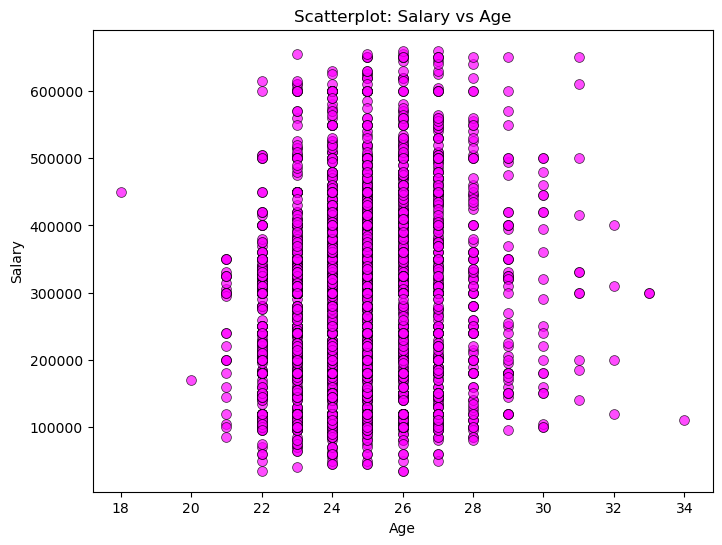

In [88]:
# Scatterplot between 'Salary' and 'Age'
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Salary', data=df1,ec='k',color = ["magenta"],alpha=0.7, s=50)
plt.title('Scatterplot: Salary vs Age')
plt.xlabel('Age')
plt.ylabel('Salary')
plt.show()

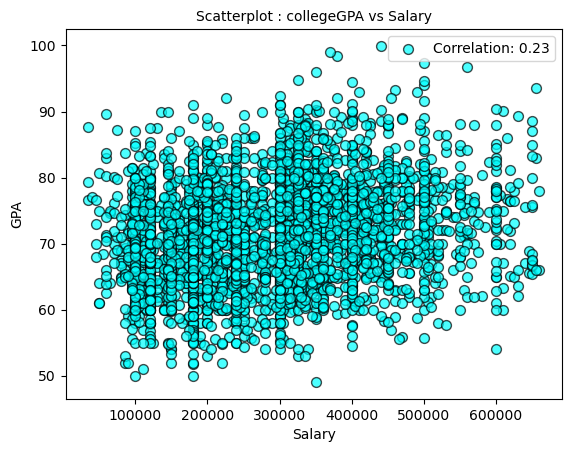

In [89]:
# Scatter plot with annotations
plt.scatter(df1['Salary'], df1['collegeGPA'], ec='k', color='cyan', alpha=0.7, s=50,
            label=f"Correlation: {round(df1[['Salary', 'collegeGPA']].corr().iloc[1, 0], 2)}")

# Set axis labels and title
plt.xlabel('Salary')
plt.ylabel('GPA')
plt.title('Scatterplot : collegeGPA vs Salary', size=10)
plt.legend()

# Display the plot
plt.show()

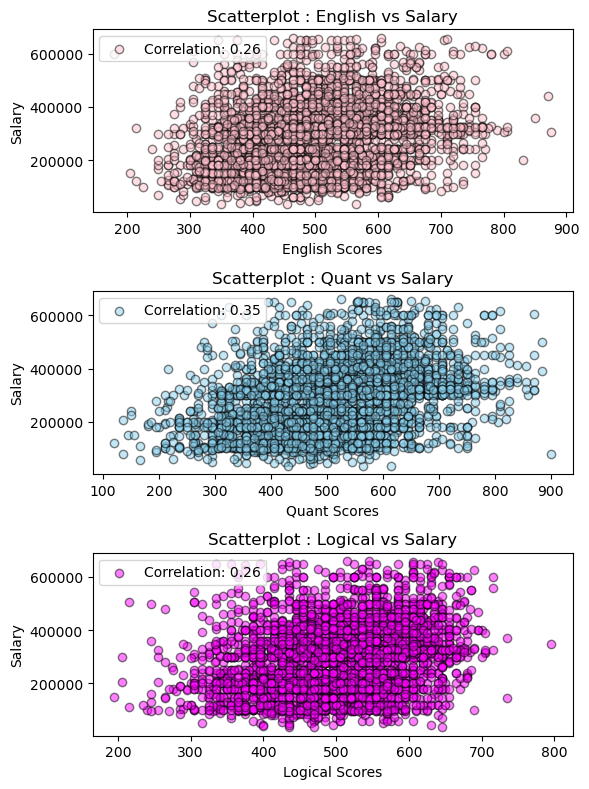

In [90]:
fig, ax = plt.subplots(3, 1, figsize=(6, 8))

# List of tuples containing information about each plot
plots_info = [
    ('English', 'pink', 'Scatterplot : English vs Salary'),
    ('Quant', 'skyblue', 'Scatterplot : Quant vs Salary'),
    ('Logical', 'magenta', 'Scatterplot : Logical vs Salary')
]

# Iterate through plots_info to create scatter plots
for i, (feature, color, title) in enumerate(plots_info):
    ax[i].scatter(df1[feature], df1['Salary'], ec='k', color=color, alpha=0.5,
                  label=f"Correlation: {round(df1[[feature, 'Salary']].corr().iloc[1, 0], 2)}")
    ax[i].set_ylabel('Salary')
    ax[i].set_xlabel(f'{feature} Scores')
    ax[i].set_title(title)
    ax[i].legend()

# Adjust layout for better visualization
plt.tight_layout()

# Display the plot
plt.show()

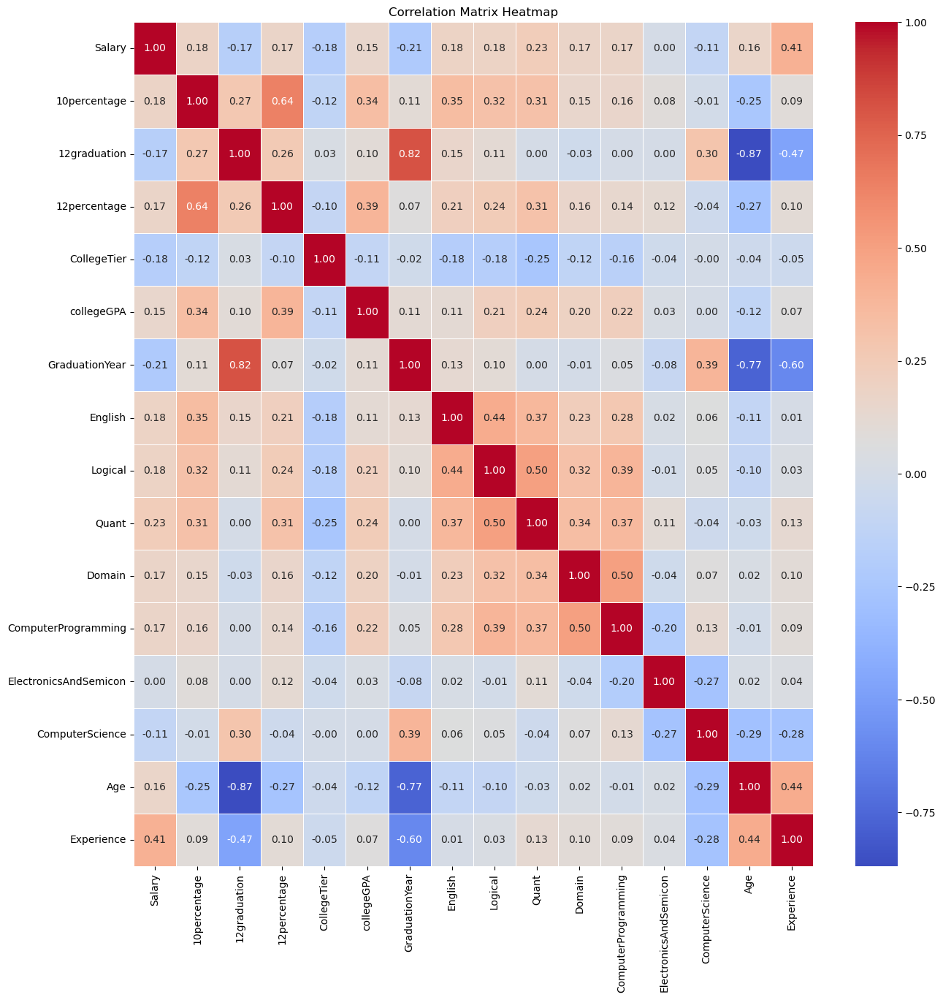

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15, 15))
sns.heatmap(numerical_col.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [92]:
#plt.figure(figsize=(15, 15))
#sns.heatmap(df1.corr(), annot=True)
#plt.show()

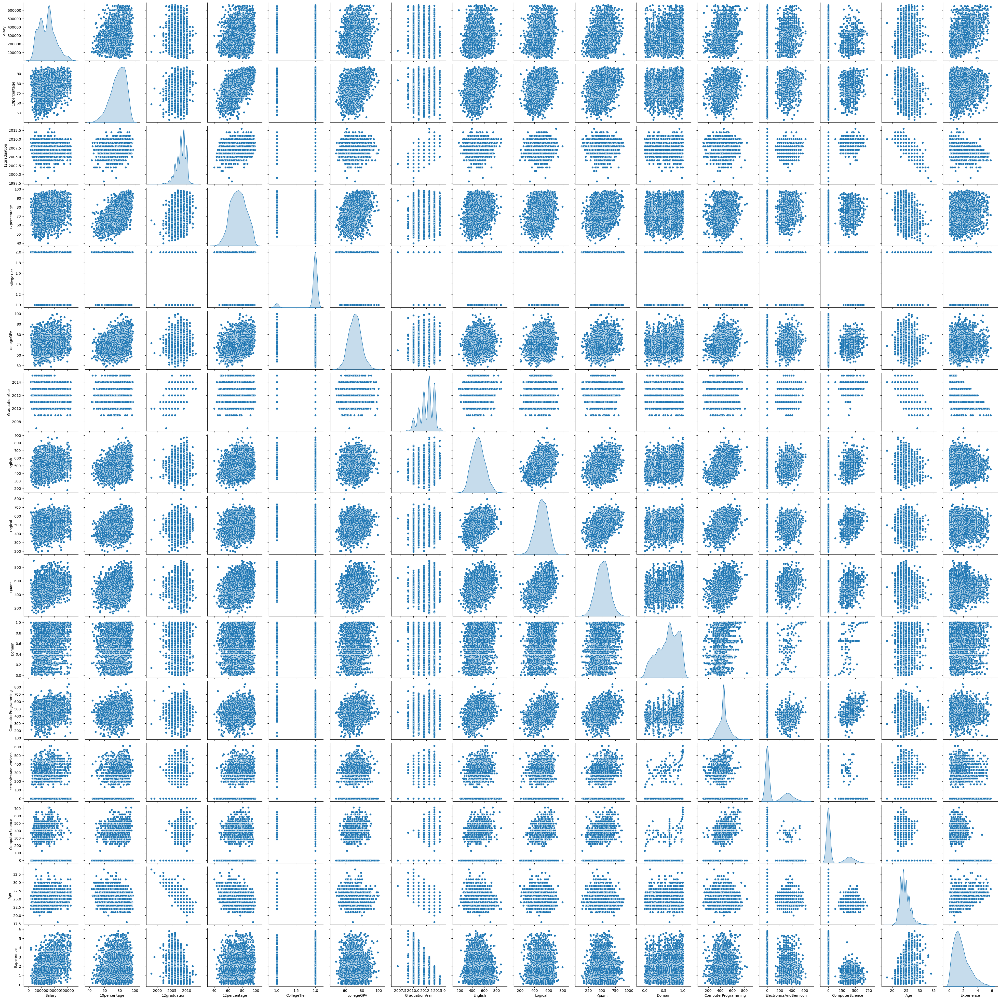

In [93]:
sns.pairplot(data = df1, diag_kind='kde')

### `Key Findings from the Exploratory Data Analysis`

**The majority of individuals aspiring to take the AMCAT exams are male professionals engaged in the field of Information Technology, typically possessing approximately 5 years of professional experience. They frequently hold a B.Tech degree, specializing in Computer Science or Information Technology, and often graduate from tier-2 colleges in Uttar Pradesh. On average, their annual earnings amount to around 300,000. AMCAT aspirants predominantly target higher-paying job opportunities within the Information Technology sector. Among the available professions, Software Engineer and Software Developer stand out as the most coveted career choices for individuals pursuing the AMCAT examinations.**

## `***********************************************************************************************************`

## `<<<<<<<<<<<<<<<<<<<<<<<<<<<<_END_>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>`

## `*************************************************************************************************************`

# `Research Questions`
**Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.**





In [94]:
df1[df1['Specialization'].str.contains('computer', case=False, na=False)].shape[0]

1493

In [96]:
# Filter rows for Computer Science jobs
computer_science_jobs = df1[df1['Specialization'].str.lower().str.contains('computer') &
                             df1['Designation'].isin(['programmer analyst', 'software engineer',
                                                     'hardware engineer', 'associate engineer'])]

# Check if there are any Computer Science jobs
if not computer_science_jobs.empty:
    # Calculate the average salary for Computer Science jobs
    average_salary = computer_science_jobs['Salary'].mean()
    # Display the average salary
    print(f"Average Salary for Computer Science Jobs: {average_salary:.2f} lakhs")
else:
    print("No Computer Science jobs found in the dataset.")

Average Salary for Computer Science Jobs: 333479.62 lakhs


 **Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)**

In [97]:
from scipy.stats import chi2_contingency

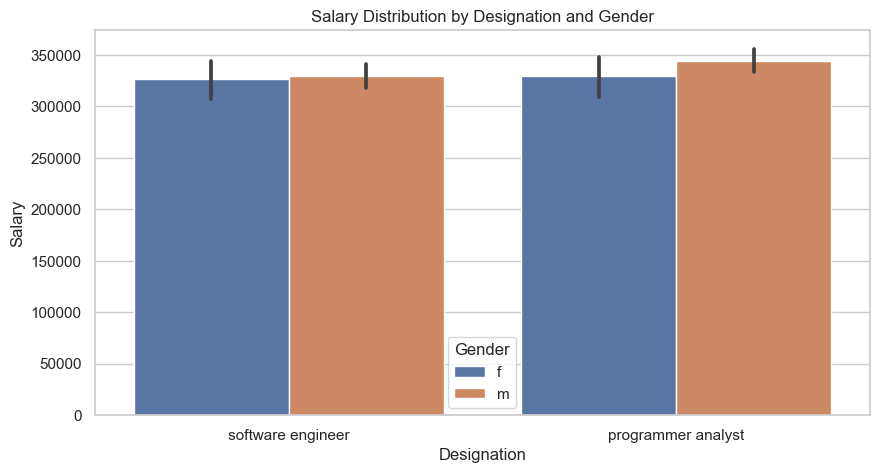

In [107]:
data = df1[df1['Designation'].isin(['programmer analyst', 'software engineer'])]

# Check if there are any rows after filtering
if not data.empty:
    # Stacked Bar Chart using Seaborn
    plt.figure(figsize=(10, 5))
    sns.barplot(x='Designation', y='Salary', hue='Gender', data=data)
    
    # Display the plot
    plt.title('Salary Distribution by Designation and Gender')
    plt.xlabel('Designation')
    plt.ylabel('Salary')
    plt.show()
else:
    print("No data found for the specified Designations.")

1 sample T-test to verify the claim
Null Hypothesis: mu = 275k
Alternate Hypothesis : mu != 275k

In [109]:
# Import the t-test function from the scipy stats module
from scipy.stats import ttest_1samp

# Calculate the population mean
popmean = (250000 + 300000) / 2

# Perform the t-test and extract the p-value
t_statistic, pv = ttest_1samp(data['Salary'], popmean=popmean)

# Set the significance level (alpha) for the test
alpha = 0.05

# Determine whether to reject or fail to reject the null hypothesis
if pv < alpha:
    print('We reject the null hypothesis. The average salary is not equal to the population mean.')
else:
    print('We fail to reject the null hypothesis. The average salary is equal to the population mean.')

We reject the null hypothesis. The average salary is not equal to the population mean.


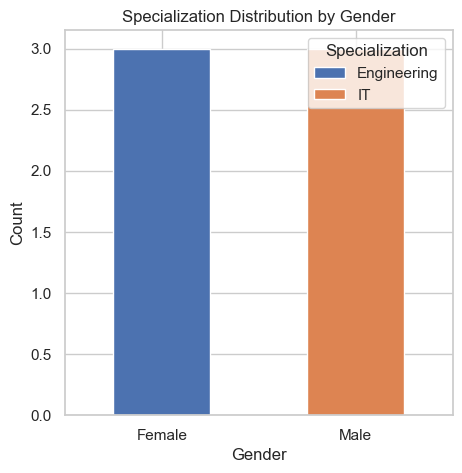

In [110]:
observed = pd.crosstab(df['Gender'], df['Specialization'])
# Plotting the stacked bar plot
observed.plot(kind='bar', stacked=True, figsize=(5, 5))
plt.title('Specialization Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=0) # Rotating x-axis labels for better readability
plt.legend(title='Specialization')
plt.show()

### `Bonus Question `

### What is the Average salary for each CollegeTier. if there is any relationship between CollegeTier and Salary.

In [114]:
# Calculating average salary for each CollegeTier
average_salary_by_tier= df1.groupby('CollegeTier')['Salary'].mean()
for tier, salary in average_salary_by_tier.items():
 print("Average Salary for Tier1 {}: {:.2f}".format(tier, salary))


Average Salary for Tier1 1: 369921.57
Average Salary for Tier1 2: 281601.25
